# Seed refinement, stage by stage — the 2×2 of {containment gate} × {template centre}

**Why this notebook exists.** The three `precision_at_k` notebook families differ in exactly one
thing — how the seed's search template is cut — and their precision@K numbers diverge. That
divergence is currently only visible as a number in a CSV. Nothing in the repo shows *why*. This
notebook walks every variant through every stage of the pipeline on the two ROIs where they
actually disagree, and saves a picture at each stage.

## The variants are a 2×2, not a list

Two independent axes. The repo fills three of the four cells; the fourth is written here.

| | template centred on **the click** | template centred on **the component's bbox centre** |
|---|---|---|
| **ungated** — the *largest* Otsu component in the 51 px window, click never consulted | `ungated_click`<br>`precision_at_k_budgets_14roi_8aug.ipynb`'s inline `largest_cc_box` | `ungated_recentred`<br>**new — the empty cell** |
| **gated** — the component the *click's own pixel* lands in; refuse and redraw if there is none | `gated_click`<br>`seed_selection.tightened_base_size`<br>**the production path today** (D8 amendment) | `gated_recentred`<br>`seed_selection.tightened_template_box`<br>D8 as originally written, superseded |

Two things this table is meant to correct:

1. **The gate is not "is the click inside the largest component?"** `tighten_box_otsu` reads
   `labels[cy, cx]` — it finds the component *by* the click and never asks whether that component
   is the largest. `largest_cc_box` takes `max(regions, key=area)` and never asks about the click.
   They are two different *selection rules* that happen to coincide whenever the click's own
   component is also the biggest thing in the window. On `245.tiff` they do coincide, which is most
   of this notebook's story.
2. **`production_seed_precision_at_k/` is not the production path.** `DECISIONS.md` D8's
   2026-09-09 amendment reversed recentring. Production today is `tightened_base_size` — gated,
   click-centred — i.e. the `gated_seed_precision_at_k/` family. The folder named "production"
   holds the superseded recentred configuration.

## The two ROIs, and why each is here

| ROI | what it isolates |
|---|---|
| **245.tiff** (canine lymphosarcoma) | The gate is **inert**: all four variants accept the same annotation (6274) at the same size (47 px), so the 2×2 collapses to two distinct runs and the *only* free variable is a 4.3 px template shift. Gate 0 proves this rather than asserting it. |
| **403.tiff** (human neuroendocrine tumour) | The only ROI of 14 where the gate **changes the draw**: the ungated rule accepts a click sitting on a background pixel and borrows an unrelated component (ann 20334, base 33); the gate refuses and retries onto a real click-containing component (ann 20356, base 51). All four variants are distinct here. |

## Configuration

8-augmentation bank (4 rotations × 2 flips × 1 scale), `TM_CCOEFF`, `hematoxylin_od`, deep floor
`z = -1.5`, NMS radius = match radius = 7.5 µm — D1/D2/D3/D5/D7 all held fixed, so the seed rule is
the only free variable. `seed_index = 0`, matching every notebook in all three families.

### One confound this notebook pins

The three committed 8-aug notebooks are **not** length-matched on `SELF_HIT_RADIUS`: the two
click-centred families use `10.0`, the recentred family uses `5.0`. That pair is exactly the
evidence D8's amendment cites to reverse recentring, so centring was not the only free variable in
it. It is very likely inert — at NMS radius == match radius, NMS suppresses everything within one
match radius of the self-peak before self-hit removal ever runs — but "very likely" is not the
standard those notebooks hold themselves to. Every variant here is therefore suppressed **twice**
from the same fused map, at 10.0 and at 5.0. Gate 2 reproduces each committed notebook at *its own*
value; Gate 3 isolates the confound; every comparison figure uses the pinned 10.0.

In [1]:
import gc
import os
import sys
import time
from dataclasses import dataclass

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Circle, Rectangle
from skimage.measure import label, regionprops

sys.path.insert(0, '..')
from midog_utils import channels as ch
from midog_utils import compare as cp
from midog_utils import dataset as ds
from midog_utils import evaluate as ev
from midog_utils import find_and_suppress as fs
from midog_utils import seed_selection as ss
from midog_utils import template_match as tm
from midog_utils import viz
from midog_utils.nms import nms_by_distance

pd.set_option('display.width', 230)
pd.set_option('display.max_columns', 80)
pd.set_option('display.max_rows', 300)
plt.rcParams['figure.facecolor'] = 'white'

NB_T0 = time.time()

# --- paths ---------------------------------------------------------------------------
IMAGES_DIR = '../images/extra_valid'
FIGDIR = 'figures'
ARTDIR = 'artifacts'
os.makedirs(FIGDIR, exist_ok=True)
os.makedirs(ARTDIR, exist_ok=True)

ROIS = ('245.tiff', '403.tiff')
SEED_INDEX = 0                       # every notebook in all three families uses this

# --- the pipeline, D1/D2/D3/D5/D7 held fixed ------------------------------------------
CHANNEL = 'hematoxylin_od'           # D3 -- unclipped optical density
METHOD = cv2.TM_CCOEFF               # D1 -- unnormalized, contrast-sensitive
PEAK_MIN_DISTANCE = 7
DEEP_FLOOR_Z = -1.5                  # near-unfiltered extraction floor (repo convention)
MAX_PEAKS = 2_000_000

NMS_RADIUS_UM = ev.MIDOG_RADIUS_UM   # 7.5 um -- D7: NMS radius == match radius
MATCH_RADIUS_UM = ev.MIDOG_RADIUS_UM

# Self-hit removal: every variant is suppressed at BOTH values from the same fused map.
# PINNED is what every comparison figure uses; ALT exists because the committed prodseed
# notebook used 5.0 while the other two used 10.0 (see the header).
SELF_HIT_PINNED = 10.0
SELF_HIT_ALT = 5.0

CFG = fs.FSConfig(channel=CHANNEL, base_size=tm.BASE_SIZE, scales=(1.0,),
                  n_angles=4, flips=(False, True),
                  peak_min_distance=PEAK_MIN_DISTANCE, self_hit_radius=SELF_HIT_PINNED)
assert CFG.n_augmentations == 8, f'expected an 8-template bank, got {CFG.n_augmentations}'

BORDER = CFG.patch_size // 2         # 36 -- the rotation-safe half-patch
OTSU_WINDOW = tm.BASE_SIZE           # 51 -- the annotation box, made odd
LARGEST_CC_KW = dict(min_area=50, max_area_frac=0.85, min_solidity=0.5)
BUDGETS = (10, 20, 30, 50)

# Display strides. STRIDE is for response maps (39 MP -> ~0.5 MP), DS for ROI overlays.
STRIDE = 8
DS = 4

print(f'{len(ROIS)} ROIs x 4 variants, 8-augmentation bank, seed_index={SEED_INDEX}')
print(f'NMS radius = match radius = {NMS_RADIUS_UM} um (D7); self-hit pinned at {SELF_HIT_PINNED} px')

2 ROIs x 4 variants, 8-augmentation bank, seed_index=0
NMS radius = match radius = 7.5 um (D7); self-hit pinned at 10.0 px


## The four seed rules

`largest_cc_box`, `_odd_local`, `draw_seed_with_retry` and `suppress` are copied **verbatim** from
`precision_at_k_budgets_14roi_8aug.ipynb`, so this notebook exercises that family's exact logic
rather than a paraphrase of it — the same choice `bbox_refinement_comparison.ipynb` made. The gated
rules call `midog_utils.seed_selection` directly, which is already shared code.

The fourth cell of the 2×2 (`ungated_recentred`) is the ~5 lines that were missing: `largest_cc_box`'s
bbox, plus the centre arithmetic lifted from `tightened_template_box` — `ix - half + (x0+x1)/2`,
converting a patch-local box back to full-image coordinates against `read_padded_patch`'s own
rounding.

**Both recentred variants own D8's three consequences.** `suppress()` and the seed-annulus
diagnostic reference the **template centre**; `border_filter` still runs on the click, so the
recentred point gets a second `read_padded_patch` check before it is accepted; and `gt_eval`
exclusion and every match-radius computation stay on the **click**, because ground truth is the
literal pathologist annotation and does not move.

In [2]:
def _odd_local(n, minimum=5):
    '''Verbatim from precision_at_k_budgets_14roi_8aug.ipynb.'''
    n = int(round(n))
    if n % 2 == 0:
        n += 1
    return max(minimum, n)


def largest_cc_box(patch, min_area=50, max_area_frac=0.85, min_solidity=0.5):
    '''Verbatim from precision_at_k_budgets_14roi_8aug.ipynb.

    Otsu-threshold `patch`; return the bbox of its LARGEST connected component by area --
    with no check that the click itself falls inside it. (y0, y1, x0, x1), patch-local,
    half-open, or None when the component fails a gate.
    '''
    if patch.ndim != 2:
        raise ValueError(f'largest_cc_box needs a single-channel patch, got {patch.shape}')
    u8 = cv2.normalize(patch.astype(np.float32), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    _, binary = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    regions = regionprops(label(binary, connectivity=2))
    if not regions:
        return None
    largest = max(regions, key=lambda r: r.area)
    if largest.area < min_area or largest.area > max_area_frac * patch.size:
        return None
    if largest.solidity < min_solidity:
        return None
    y0, x0, y1, x1 = largest.bbox
    return int(y0), int(y1), int(x0), int(x1)


def draw_seed_with_retry(pool, rng, check_fn):
    '''Verbatim. Draw a row via `rng.integers`; on failure drop it and redraw on the same stream.'''
    working, retries = pool.copy(), 0
    while len(working) > 0:
        idx = int(rng.integers(len(working)))
        row = working.iloc[idx]
        result = check_fn(row)
        if result is not None:
            return row, result, retries
        working = working.drop(working.index[idx])
        retries += 1
    raise ValueError('seed pool exhausted -- no candidate passed check_fn')


def suppress(centers, scores, radius, ref_xy, self_hit_radius):
    '''NMS at `radius`, then drop the template's own self-correlation. Returns (centers, scores).

    `ref_xy` is the point the TEMPLATE was built from -- the click for the click-centred
    variants, the accepted component's bbox centre for the recentred ones (D8 item 1: the
    self-correlation peak lands where the template is centred, not where the click is).
    '''
    keep = nms_by_distance(centers, scores, radius)
    c, s = centers[keep], scores[keep]
    if len(c):
        ok = np.hypot(c[:, 0] - ref_xy[0], c[:, 1] - ref_xy[1]) > self_hit_radius
        c, s = c[ok], s[ok]
    return c, s


@dataclass(frozen=True)
class SeedRule:
    name: str
    gated: bool       # True -> the component under the click; False -> the largest component
    recentre: bool    # True -> template centre is the component's bbox centre; False -> the click
    label: str        # short human label for figures
    provenance: str   # which committed notebook family this reproduces


VARIANTS = (
    SeedRule('ungated_click', False, False, 'ungated · click',
             'precision_at_k_budgets_14roi_8aug.ipynb (inline largest_cc_box)'),
    SeedRule('ungated_recentred', False, True, 'ungated · recentred',
             'NEW -- the empty cell of the 2x2, no committed run exists'),
    SeedRule('gated_click', True, False, 'gated · click',
             'gated_seed_precision_at_k_8aug.ipynb (tightened_base_size) -- PRODUCTION'),
    SeedRule('gated_recentred', True, True, 'gated · recentred',
             'production_seed_precision_at_k_8aug.ipynb (tightened_template_box) -- superseded'),
)
VAR_BY_NAME = {v.name: v for v in VARIANTS}

# Which committed CSV each variant must reproduce, and at which self-hit radius that CSV
# was actually produced. `ungated_recentred` has no committed run -- it is new here.
REPRO = {
    'ungated_click':    ('../results/precision_at_k_14roi_8aug_per_roi.csv', SELF_HIT_PINNED),
    'gated_click':      ('../results/precision_at_k_14roi_gatedseed_8aug_per_roi.csv', SELF_HIT_PINNED),
    'gated_recentred':  ('../results/precision_at_k_14roi_prodseed_8aug_per_roi.csv', SELF_HIT_ALT),
    'ungated_recentred': (None, None),
}

VAR_COLOR = {'ungated_click': '#e5342b', 'ungated_recentred': '#f2900d',
             'gated_click': '#0b8a3c', 'gated_recentred': '#1b63d6'}

print('\n'.join(f'{v.name:20s} gated={v.gated!s:5s} recentre={v.recentre!s:5s}  {v.provenance}'
                for v in VARIANTS))

ungated_click        gated=False recentre=False  precision_at_k_budgets_14roi_8aug.ipynb (inline largest_cc_box)
ungated_recentred    gated=False recentre=True   NEW -- the empty cell of the 2x2, no committed run exists
gated_click          gated=True  recentre=False  gated_seed_precision_at_k_8aug.ipynb (tightened_base_size) -- PRODUCTION
gated_recentred      gated=True  recentre=True   production_seed_precision_at_k_8aug.ipynb (tightened_template_box) -- superseded


In [3]:
def tightened_template_box_asis(structural_channel, cx, cy, otsu_window=tm.BASE_SIZE,
                                minimum=5):
    '''`seed_selection.tightened_template_box` as it stood before 2026-09-10.

    The library version was corrected on 2026-09-10 (`D8_TEMPLATE_ANCHOR.md`): its centre is now
    (x0 + x1 - 1) / 2, the centre of the pixels the half-open bbox covers, rather than
    (x0 + x1) / 2, the centre of the area it spans. This notebook compares the four *committed*
    seed rules, so the recentred arm must keep the formula those notebooks actually ran --
    otherwise Gate 2 below would be checking the fix against CSVs produced without it.
    '''
    patch = tm.read_padded_patch(structural_channel, cx, cy, otsu_window)
    if patch is None:
        return None
    box = ss.tighten_box_otsu(patch)
    if box is None:
        return None
    y0, y1, x0, x1 = box
    base_size = ss._odd(max(y1 - y0, x1 - x0), minimum=minimum)
    half = otsu_window // 2
    ix, iy = int(round(cx)), int(round(cy))
    return base_size, ix - half + (x0 + x1) / 2.0, iy - half + (y0 + y1) / 2.0


def resolve_seed(rule, gray_inv, hem, seed_pool, rng):
    '''Draw a seed under one rule. Returns (row, (base_size, tpl_x, tpl_y), n_retries).

    The two gated branches are `seed_selection`'s own functions, unmodified. The two
    ungated branches are the notebook-inline `largest_cc_box`, plus -- for the new
    `ungated_recentred` cell only -- the patch-local -> full-image centre arithmetic
    copied from `tightened_template_box`.
    '''
    half = OTSU_WINDOW // 2

    def _check(row):
        cx, cy = float(row['cx']), float(row['cy'])
        if rule.gated:
            if rule.recentre:
                r = tightened_template_box_asis(gray_inv, cx, cy, otsu_window=OTSU_WINDOW)
                if r is None:
                    return None
                base_size, tx, ty = r
            else:
                r = ss.tightened_base_size(gray_inv, cx, cy, otsu_window=OTSU_WINDOW)
                if r is None:
                    return None
                base_size, tx, ty = r, cx, cy
        else:
            p = tm.read_padded_patch(gray_inv, cx, cy, OTSU_WINDOW)
            if p is None:
                return None
            box = largest_cc_box(p, **LARGEST_CC_KW)
            if box is None:
                return None
            y0, y1, x0, x1 = box
            base_size = _odd_local(max(y1 - y0, x1 - x0))
            if rule.recentre:
                ix, iy = int(round(cx)), int(round(cy))   # read_padded_patch's own rounding
                tx = ix - half + (x0 + x1) / 2.0
                ty = iy - half + (y0 + y1) / 2.0
            else:
                tx, ty = cx, cy
        # D8 "what it costs", item 2: border safety moves with the centre. `border_filter`'s
        # margin was sized for a click-centred read, so a recentred point needs its own check
        # that the full rotation-safe patch is actually readable there.
        if rule.recentre and tm.read_padded_patch(hem, tx, ty, CFG.patch_size) is None:
            return None
        return int(base_size), float(tx), float(ty)

    return draw_seed_with_retry(seed_pool, rng, _check)


def seed_window_diag(gray_inv, cx, cy):
    '''Everything the Otsu step computes for one click, kept for the figures.

    Reproduces `tighten_box_otsu`'s own preprocessing exactly (normalize to u8, binary
    Otsu, 8-connected labels) so the pictures show the arrays the decision was made on,
    not a re-derivation that might differ.
    '''
    patch = tm.read_padded_patch(gray_inv, cx, cy, OTSU_WINDOW)
    if patch is None:
        return None
    u8 = cv2.normalize(patch.astype(np.float32), None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    thr, binary = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    labels = label(binary, connectivity=2)
    regions = regionprops(labels)
    ccy, ccx = patch.shape[0] // 2, patch.shape[1] // 2
    click_label = int(labels[ccy, ccx])
    largest_label = int(max(regions, key=lambda r: r.area).label) if regions else 0
    by_label = {int(r.label): r for r in regions}
    return dict(patch=patch, u8=u8, otsu_thresh=float(thr), binary=binary, labels=labels,
                click_label=click_label, largest_label=largest_label, regions=by_label,
                click_rc=(ccy, ccx),
                click_box=(ss.tighten_box_otsu(patch) if click_label else None),
                largest_box=largest_cc_box(patch, **LARGEST_CC_KW))

## The run

Per ROI: load once, resolve all four seeds against the same `gray_inverted` channel and the same
per-ROI RNG stream, then run one `matchTemplate` pass per variant. Each pass is suppressed twice
from the same fused map (10.0 and 5.0 px self-hit), so the confound costs nothing extra.

What is kept for the figures: the seed-window arrays, the 73 px patch, the 8 templates, a strided
copy of the fused map and of `best_aug`, and the full bucketed detection pool (written to
`artifacts/`). Full-resolution maps are freed as soon as the strided copies exist.

In [4]:
def run_variant(rule, roi, seed_pool, hem, gray_inv, gt, image_id, mpp, match_radius, nms_radius):
    '''One seed rule end to end on one ROI. Returns a record dict of every stage's output.'''
    t0 = time.time()
    H, W = hem.shape[:2]

    # --- the seed -------------------------------------------------------------------
    rng = np.random.default_rng([SEED_INDEX, image_id])   # same stream every variant draws from
    seed, (base_size, tpl_x, tpl_y), n_retries = resolve_seed(rule, gray_inv, hem, seed_pool, rng)
    click_xy = (float(seed['cx']), float(seed['cy']))
    tpl_xy = (float(tpl_x), float(tpl_y))
    seed_ann_id = int(seed['ann_id'])

    # D8 item 3: ground truth does not move. The CLICK's ann_id is what gets excluded, and
    # both categories stay pooled so one detection cannot claim a mitotic figure and a
    # look-alike at the same time (evaluate.bucket_detections' own requirement).
    gt_eval = gt[gt['ann_id'] != seed_ann_id].reset_index(drop=True)

    # --- one match --------------------------------------------------------------------
    patch = tm.read_padded_patch(hem, *tpl_xy, CFG.patch_size)
    templates, metas = tm.build_augmentations(patch, base_size, CFG.scales, CFG.n_angles, CFG.flips)
    PAD = max((t.shape[0] - 1) // 2 for t in templates)
    hem_p = cv2.copyMakeBorder(hem, PAD, PAD, PAD, PAD, borderType=cv2.BORDER_REPLICATE)
    fused_p, best_p, valid_p = tm.fused_response(hem_p, templates, CFG.scale_normalize, method=METHOD)
    fused = fused_p[PAD:PAD + H, PAD:PAD + W]
    best = best_p[PAD:PAD + H, PAD:PAD + W]
    valid = valid_p[PAD:PAD + H, PAD:PAD + W]
    assert bool(valid.all()), f'{roi}/{rule.name}: padding left part of the ROI unreachable (PAD={PAD})'

    med, mad = tm.robust_stats(fused, valid)
    cut = med + DEEP_FLOOR_Z * mad
    centers, scores = tm.extract_peaks(fused, valid, PEAK_MIN_DISTANCE, cut, MAX_PEAKS)
    n_peaks = len(centers)
    assert n_peaks < MAX_PEAKS, f'{roi}/{rule.name}: MAX_PEAKS is binding, raise it'

    # Strided copies for every figure; the full-resolution maps go away immediately after.
    fused_s = np.array(fused[::STRIDE, ::STRIDE], dtype=np.float32)
    best_s = np.array(best[::STRIDE, ::STRIDE], dtype=np.int16)
    del hem_p, fused_p, best_p, valid_p, fused, best, valid
    gc.collect()

    # --- NMS, then self-hit removal at both radii from the same peak set ---------------
    n_after_nms = int(len(nms_by_distance(centers, scores, nms_radius)))  # returns INDICES, not a mask
    pools, evals, annulus = {}, {}, {}
    for shr in (SELF_HIT_PINNED, SELF_HIT_ALT):
        c, s = suppress(centers, scores, nms_radius, tpl_xy, shr)
        assert bool(np.all(np.diff(s) <= 0)), f'{roi}/{rule.name}: post-NMS pool is not score-descending'
        pool = pd.DataFrame({'cx': c[:, 0], 'cy': c[:, 1], 'score': s})

        # Seed annulus. The committed notebooks ASSERT this is zero. Here it is only
        # COMPUTED: for the ungated variants on 403 the template is built from a structure
        # that is not the annotated seed at all, so "the self-hit" is not the seed's echo
        # and the argument for zero does not transfer.
        annulus[shr] = int((np.hypot(pool['cx'] - tpl_xy[0], pool['cy'] - tpl_xy[1])
                            <= match_radius).sum())

        arm = cp.Arm('tm_score_deep_floor', (lambda d=pool: d), rank_key='score',
                     seeded=True, z=DEEP_FLOOR_Z, z_dependent=True,
                     nms_radius=nms_radius, caps=(MAX_PEAKS,))
        ctx = dict(file_name=roi, variant=rule.name, self_hit_radius=shr,
                   seed_ann_id=seed_ann_id, base_size=base_size)
        checks = []
        out = cp.evaluate_arms([arm], gt_eval, match_radius, roi_shape=(H, W), mpp=mpp,
                               budgets=BUDGETS, context=ctx, checks=checks)
        # The SAME sorted frame evaluate_arms scored, re-bucketed for the figures. Sorting
        # with cp._rank (rather than a hand-rolled sort_values) is what makes Gate 4 exact:
        # a tie block reordered differently would silently score a different ranking.
        ranked = cp._rank(pool, 'score')
        det_out, gt_out = ev.bucket_detections(ranked, gt_eval, match_radius)
        pools[shr] = dict(det=det_out, gt=gt_out, checks=pd.DataFrame(checks))
        evals[shr] = out

    rec = dict(
        roi=roi, variant=rule.name, rule=rule, image_id=image_id, mpp=mpp,
        H=H, W=W, match_radius=match_radius, nms_radius=nms_radius,
        seed_ann_id=seed_ann_id, click_xy=click_xy, tpl_xy=tpl_xy,
        offset_px=float(np.hypot(tpl_xy[0] - click_xy[0], tpl_xy[1] - click_xy[1])),
        base_size=base_size, n_retries=n_retries, pad=PAD,
        patch73=patch, templates=templates, metas=metas,
        med=float(med), mad=float(mad), cut=float(cut),
        n_peaks=n_peaks, n_after_nms=n_after_nms,
        fused_s=fused_s, best_s=best_s,
        pools=pools, evals=evals, annulus=annulus,
        gt_eval=gt_eval, n_gt_mitotic=int((gt_eval['category_id'] == ds.MITOTIC).sum()),
        t_s=round(time.time() - t0, 1),
    )
    del centers, scores, templates
    gc.collect()
    print(f'  [{rule.name:18s}] ann={seed_ann_id:6d} base={base_size:2d} '
          f'offset={rec["offset_px"]:5.2f}px retries={n_retries} '
          f'peaks={n_peaks:7d} -> nms={n_after_nms:6d} -> pool={len(pools[SELF_HIT_PINNED]["det"]):6d} '
          f'[{rec["t_s"]:.0f}s]', flush=True)
    return rec

In [5]:
images, annotations = ds.load_annotations('../databases/MIDOG++.json')
ds.check_invariants(annotations)
meta_ix = images.set_index('file_name')[['image_id', 'tumor_type']]

RUNS = {}      # (roi, variant) -> record
ROI_INFO = {}  # roi -> shared per-ROI context (gt, seed pool, seed-window diagnostics, small RGB)

t_run = time.time()
for roi in ROIS:
    path = f'{IMAGES_DIR}/{roi}'
    image_id = int(meta_ix.loc[roi, 'image_id'])
    domain = meta_ix.loc[roi, 'tumor_type']
    print(f'\n=== {roi}  ({domain}, image_id={image_id})', flush=True)

    rgb = ds.load_roi(path)
    mpp = ds.roi_mpp(path)
    roi_shape = rgb.shape
    match_radius = ev.radius_px(mpp, MATCH_RADIUS_UM)
    nms_radius = ev.radius_px(mpp, NMS_RADIUS_UM)
    hem = ch.to_channel(rgb, CHANNEL)
    gray_inv = ch.to_gray_inverted(rgb)

    gt = ds.image_annotations(annotations, roi)
    seed_pool, flagged = ss.agreement_pool(gt[gt['category_id'] == ds.MITOTIC])
    seed_pool = ss.border_filter(seed_pool, BORDER, roi_shape)
    print(f'    seed pool: {len(seed_pool)} unanimous, border-filtered mitotic annotations '
          f'(contested tier: {flagged}); match radius {match_radius:.2f} px', flush=True)

    for rule in VARIANTS:
        RUNS[(roi, rule.name)] = run_variant(rule, roi, seed_pool, hem, gray_inv, gt,
                                             image_id, mpp, match_radius, nms_radius)
        gc.collect()

    # Seed-window diagnostics for every distinct click drawn on this ROI, kept for the
    # figures. Also the RGB crop around each, at full resolution.
    diags, crops = {}, {}
    for rule in VARIANTS:
        r = RUNS[(roi, rule.name)]
        cx, cy = r['click_xy']
        key = r['seed_ann_id']
        if key not in diags:
            diags[key] = seed_window_diag(gray_inv, cx, cy)
            half = OTSU_WINDOW // 2
            ix, iy = int(round(cx)), int(round(cy))
            crops[key] = rgb[iy - half:iy + half + 1, ix - half:ix + half + 1].copy()

    ROI_INFO[roi] = dict(image_id=image_id, domain=domain, mpp=mpp, shape=roi_shape,
                         match_radius=match_radius, nms_radius=nms_radius,
                         gt=gt, seed_pool=seed_pool, flagged=flagged,
                         diags=diags, crops=crops,
                         rgb_small=np.array(rgb[::DS, ::DS]))
    del rgb, hem, gray_inv
    gc.collect()

print(f'\n{len(RUNS)} runs in {time.time() - t_run:.0f}s')


=== 245.tiff  (canine lymphosarcoma, image_id=245)


    seed pool: 78 unanimous, border-filtered mitotic annotations (contested tier: False); match radius 30.22 px


  [ungated_click     ] ann=  6274 base=47 offset= 0.00px retries=0 peaks=  86353 -> nms= 19192 -> pool= 19191 [16s]


  [ungated_recentred ] ann=  6274 base=47 offset= 4.30px retries=0 peaks=  76233 -> nms= 18791 -> pool= 18790 [13s]


  [gated_click       ] ann=  6274 base=47 offset= 0.00px retries=0 peaks=  86353 -> nms= 19192 -> pool= 19191 [12s]


  [gated_recentred   ] ann=  6274 base=47 offset= 4.30px retries=0 peaks=  76233 -> nms= 18791 -> pool= 18790 [10s]



=== 403.tiff  (human neuroendocrine tumor, image_id=403)


    seed pool: 36 unanimous, border-filtered mitotic annotations (contested tier: False); match radius 33.06 px


  [ungated_click     ] ann= 20334 base=33 offset= 0.00px retries=0 peaks=  58487 -> nms= 17237 -> pool= 17236 [10s]


  [ungated_recentred ] ann= 20334 base=33 offset=16.01px retries=0 peaks=  44919 -> nms= 17154 -> pool= 17153 [9s]


  [gated_click       ] ann= 20356 base=51 offset= 0.00px retries=1 peaks=  35985 -> nms= 16690 -> pool= 16689 [12s]


  [gated_recentred   ] ann= 20356 base=51 offset= 1.58px retries=1 peaks=  39328 -> nms= 16407 -> pool= 16406 [11s]



8 runs in 103s


In [6]:
# One row per run: the seed each rule landed on, and what it cost.
SEEDS = pd.DataFrame([
    dict(roi=r['roi'], variant=r['variant'], seed_ann_id=r['seed_ann_id'],
         n_retries=r['n_retries'], base_size=r['base_size'],
         click_x=r['click_xy'][0], click_y=r['click_xy'][1],
         tpl_x=r['tpl_xy'][0], tpl_y=r['tpl_xy'][1], offset_px=round(r['offset_px'], 3),
         n_gt_mitotic=r['n_gt_mitotic'], n_peaks=r['n_peaks'], n_after_nms=r['n_after_nms'],
         n_detections=len(r['pools'][SELF_HIT_PINNED]['det']),
         n_detections_shr5=len(r['pools'][SELF_HIT_ALT]['det']),
         map_median=round(r['med'], 4), mad_scale=round(r['mad'], 4), t_s=r['t_s'])
    for r in RUNS.values()
])
SEEDS.to_csv(f'{ARTDIR}/seeds.csv', index=False)

# Every variant's full bucketed pool, at the pinned self-hit radius.
for (roi, var), r in RUNS.items():
    r['pools'][SELF_HIT_PINNED]['det'].to_csv(
        f'{ARTDIR}/pool_{roi.replace(".tiff", "")}_{var}.csv', index=False)

SEEDS

,roi,variant,seed_ann_id,n_retries,base_size,click_x,click_y,tpl_x,tpl_y,offset_px,n_gt_mitotic,n_peaks,n_after_nms,n_detections,n_detections_shr5,map_median,mad_scale,t_s
0,245.tiff,ungated_click,6274,0,47,6356.0,535.0,6356.0,535.0,0.000,89,86353,19192,19191,19191,0.2700,0.1501,16.3
1,245.tiff,ungated_recentred,6274,0,47,6356.0,535.0,6359.5,537.5,4.301,89,76233,18791,18790,18790,0.2851,0.1547,12.7
2,245.tiff,gated_click,6274,0,47,6356.0,535.0,6356.0,535.0,0.000,89,86353,19192,19191,19191,0.2700,0.1501,12.3
3,245.tiff,gated_recentred,6274,0,47,6356.0,535.0,6359.5,537.5,4.301,89,76233,18791,18790,18790,0.2851,0.1547,9.5
4,403.tiff,ungated_click,20334,0,33,4939.0,717.0,4939.0,717.0,0.000,52,58487,17237,17236,17237,0.2953,0.4263,9.9
5,403.tiff,ungated_recentred,20334,0,33,4939.0,717.0,4938.5,701.0,16.008,52,44919,17154,17153,17153,0.1735,0.3216,9.4
6,403.tiff,gated_click,20356,1,51,2227.0,2970.0,2227.0,2970.0,0.000,52,35985,16690,16689,16689,0.4240,0.6702,11.6
7,403.tiff,gated_recentred,20356,1,51,2227.0,2970.0,2227.5,2968.5,1.581,52,39328,16407,16406,16406,0.6209,0.9117,11.3


## Gates — before any picture

Five things must hold before a figure in this notebook is worth looking at. Each is asserted, not
argued.

0. **The containment gate is inert on 245.** The two selection rules return the *same box*.
1. **The containment gate is live on 403.** The two rules draw *different annotations*.
2. **Reproduction.** Each of the three variants that has a committed 8-aug run reproduces it
   exactly — `n_detections` and `tp_at_budget` at every K — **at that notebook's own
   `SELF_HIT_RADIUS`**. Checking the recentred arm against its CSV using the pinned 10.0 would make
   this gate silently *be* Gate 3, and a live confound would surface here as a reproduction failure
   pointing at the wrong cause.
3. **No arm carries its own self-correlation, and the `SELF_HIT_RADIUS` mismatch between the
   committed notebooks is not a confound.** (3a) At the radius each arm was actually run with,
   nothing survives inside one match radius of its template centre. (3b) Wherever both radii clear
   that annulus, they give identical pools. Any run where they differ is named, with the detection
   that differs.
4. **One scoring path.** The bucketed frame the figures use is the same frame `evaluate_arms`
   scored, so a tie block cannot reorder between the numbers and the pictures.

In [7]:
# Rank is used everywhere below; add it once, on the frame evaluate_arms actually scored.
for r in RUNS.values():
    for shr, p in r['pools'].items():
        # `cp._rank` already attached a 0-based `rank`. Make it 1-based so "rank" and
        # "budget K" are the same units, by ASSIGNMENT (not insert) so re-running is safe.
        p['det'] = p['det'].reset_index(drop=True)
        p['det']['rank'] = np.arange(1, len(p['det']) + 1)

GATES = []


def gate(name, roi, passed, detail):
    GATES.append(dict(gate=name, roi=roi, passed=bool(passed), detail=detail))
    print(f"{'PASS' if passed else 'FAIL'}  {name:34s} {roi:10s} {detail}")
    return passed

In [8]:
# --- Gate 0: on 245 the two selection rules return the same box -----------------------
# This is the claim the whole 245 story rests on. `largest_cc_box` takes the largest
# component in the window; `tighten_box_otsu` takes the component under the click. If they
# return the same box then the containment gate cannot change anything downstream on this
# ROI, and every difference that follows is the template CENTRE and nothing else.
d245 = ROI_INFO['245.tiff']['diags'][RUNS[('245.tiff', 'gated_click')]['seed_ann_id']]
same_box = d245['click_box'] == d245['largest_box']
gate('G0 gate inert (same box)', '245.tiff', same_box,
     f"click-component box {d245['click_box']} vs largest-component box {d245['largest_box']}; "
     f"click_label={d245['click_label']} largest_label={d245['largest_label']}")
assert same_box, ('245.tiff: the two selection rules disagree on the box -- the premise this '
                  'notebook is built on does not hold, stop and re-read before any figure')

# The stronger corollary: with the same box, all four variants must collapse into two runs.
s245 = SEEDS[SEEDS['roi'] == '245.tiff'].set_index('variant')
collapse = (s245.loc['ungated_click', 'n_detections'] == s245.loc['gated_click', 'n_detections']
            and s245.loc['ungated_recentred', 'n_detections'] == s245.loc['gated_recentred', 'n_detections'])
gate('G0b 2x2 collapses to 2 runs', '245.tiff', collapse,
     f"click-centred pair {s245.loc['ungated_click', 'n_detections']}/"
     f"{s245.loc['gated_click', 'n_detections']}, recentred pair "
     f"{s245.loc['ungated_recentred', 'n_detections']}/{s245.loc['gated_recentred', 'n_detections']} detections")
assert collapse

PASS  G0 gate inert (same box)           245.tiff   click-component box (4, 51, 6, 51) vs largest-component box (4, 51, 6, 51); click_label=3 largest_label=3
PASS  G0b 2x2 collapses to 2 runs        245.tiff   click-centred pair 19191/19191, recentred pair 18790/18790 detections


In [9]:
# --- Gate 1: on 403 the gate changes the draw ------------------------------------------
# The one ROI of 14 where the containment gate is not a no-op: the ungated rule accepts a
# click whose own pixel is background and borrows an unrelated component's size for it;
# the gate refuses that draw and redraws on the same RNG stream onto a real, click-containing
# component. This is what the gate is FOR, and 245 cannot show it.
s403 = SEEDS[SEEDS['roi'] == '403.tiff'].set_index('variant')
un, ga = s403.loc['ungated_click'], s403.loc['gated_click']
live = (un['seed_ann_id'] != ga['seed_ann_id']) and (ga['n_retries'] > un['n_retries'])
gate('G1 gate live (different seed)', '403.tiff', live,
     f"ungated -> ann {un['seed_ann_id']} base {un['base_size']} after {un['n_retries']} retries; "
     f"gated -> ann {ga['seed_ann_id']} base {ga['base_size']} after {ga['n_retries']} retries")
assert live, '403.tiff: expected the containment gate to change the draw here'

# And what the ungated rule actually did on the click it accepted: its own pixel is background.
d403_un = ROI_INFO['403.tiff']['diags'][int(un['seed_ann_id'])]
gate('G1b ungated click is background', '403.tiff', d403_un['click_label'] == 0,
     f"labels[click] = {d403_un['click_label']} (0 = background); "
     f"largest component label {d403_un['largest_label']}, its box {d403_un['largest_box']}")

PASS  G1 gate live (different seed)      403.tiff   ungated -> ann 20334 base 33 after 0 retries; gated -> ann 20356 base 51 after 1 retries
PASS  G1b ungated click is background    403.tiff   labels[click] = 0 (0 = background); largest component label 1, its box (0, 18, 8, 41)


True

In [10]:
# --- Gate 2: reproduce each committed 8-aug run, at ITS OWN self-hit radius ------------
rows = []
for (roi, var), r in RUNS.items():
    csv, shr = REPRO[var]
    if csv is None:
        rows.append(dict(roi=roi, variant=var, csv='(new -- no committed run)', self_hit=np.nan,
                         n_det_ours=len(r['pools'][SELF_HIT_PINNED]['det']), n_det_csv=np.nan,
                         tp_ours='-', tp_csv='-', match=True))
        continue
    ref = pd.read_csv(csv).set_index('file_name').loc[roi]
    ours = r['evals'][shr]
    tp_ours = tuple(int(ours.loc[ours['budget'] == k, 'tp_at_budget'].iloc[0]) for k in BUDGETS)
    tp_csv = tuple(int(ref[f'tp_at_{k}']) for k in BUDGETS)
    n_ours = int(ours['n_detections'].iloc[0])
    n_csv = int(ref['n_detections'])
    rows.append(dict(roi=roi, variant=var, csv=os.path.basename(csv), self_hit=shr,
                     n_det_ours=n_ours, n_det_csv=n_csv, tp_ours=tp_ours, tp_csv=tp_csv,
                     match=bool(n_ours == n_csv and tp_ours == tp_csv)))

REPRO_TBL = pd.DataFrame(rows)
for _, x in REPRO_TBL.iterrows():
    gate('G2 reproduces committed run', f"{x['roi']}/{x['variant'][:9]}", x['match'],
         f"n_det {x['n_det_ours']} vs {x['n_det_csv']}, tp@{BUDGETS} {x['tp_ours']} vs {x['tp_csv']}")
assert REPRO_TBL['match'].all(), \
    'a committed 8-aug run did not reproduce -- nothing below this cell is trustworthy'
REPRO_TBL

PASS  G2 reproduces committed run        245.tiff/ungated_c n_det 19191 vs 19191.0, tp@(10, 20, 30, 50) (0, 2, 2, 3) vs (0, 2, 2, 3)
PASS  G2 reproduces committed run        245.tiff/ungated_r n_det 18790 vs nan, tp@(10, 20, 30, 50) - vs -
PASS  G2 reproduces committed run        245.tiff/gated_cli n_det 19191 vs 19191.0, tp@(10, 20, 30, 50) (0, 2, 2, 3) vs (0, 2, 2, 3)
PASS  G2 reproduces committed run        245.tiff/gated_rec n_det 18790 vs 18790.0, tp@(10, 20, 30, 50) (1, 1, 1, 1) vs (1, 1, 1, 1)
PASS  G2 reproduces committed run        403.tiff/ungated_c n_det 17236 vs 17236.0, tp@(10, 20, 30, 50) (4, 6, 10, 17) vs (4, 6, 10, 17)
PASS  G2 reproduces committed run        403.tiff/ungated_r n_det 17153 vs nan, tp@(10, 20, 30, 50) - vs -
PASS  G2 reproduces committed run        403.tiff/gated_cli n_det 16689 vs 16689.0, tp@(10, 20, 30, 50) (4, 8, 11, 15) vs (4, 8, 11, 15)
PASS  G2 reproduces committed run        403.tiff/gated_rec n_det 16406 vs 16406.0, tp@(10, 20, 30, 50) (4, 8, 11

,roi,variant,csv,self_hit,n_det_ours,n_det_csv,tp_ours,tp_csv,match
0,245.tiff,ungated_click,precision_at_k_14roi_8aug_per_roi.csv,10.0,19191,19191.0,"(0, 2, 2, 3)","(0, 2, 2, 3)",True
1,245.tiff,ungated_recentred,(new -- no committed run),NaN,18790,NaN,-,-,True
2,245.tiff,gated_click,precision_at_k_14roi_gatedseed_8aug_per_roi.csv,10.0,19191,19191.0,"(0, 2, 2, 3)","(0, 2, 2, 3)",True
3,245.tiff,gated_recentred,precision_at_k_14roi_prodseed_8aug_per_roi.csv,5.0,18790,18790.0,"(1, 1, 1, 1)","(1, 1, 1, 1)",True
4,403.tiff,ungated_click,precision_at_k_14roi_8aug_per_roi.csv,10.0,17236,17236.0,"(4, 6, 10, 17)","(4, 6, 10, 17)",True
5,403.tiff,ungated_recentred,(new -- no committed run),NaN,17153,NaN,-,-,True
6,403.tiff,gated_click,precision_at_k_14roi_gatedseed_8aug_per_roi.csv,10.0,16689,16689.0,"(4, 8, 11, 15)","(4, 8, 11, 15)",True
7,403.tiff,gated_recentred,precision_at_k_14roi_prodseed_8aug_per_roi.csv,5.0,16406,16406.0,"(4, 8, 11, 14)","(4, 8, 11, 14)",True


In [11]:
# --- Gate 3: the SELF_HIT_RADIUS mismatch between the committed notebooks ---------------
# The committed prodseed notebook used 5.0 where the other two used 10.0, so the pair D8's
# amendment compares was not length-matched. Both pools here come from the SAME peak set and
# the SAME NMS, so this isolates the self-hit filter exactly.
#
# The invariant that actually matters is NOT "both radii agree". It is: at each arm's own
# radius, the seed's self-correlation is gone and nothing survives within one match radius
# of the template centre -- `annulus == 0`, the check every committed notebook asserts.
KMAX = max(BUDGETS)
COLS = ['cx', 'cy', 'score']
rows = []
for (roi, var), r in RUNS.items():
    a, b = r['pools'][SELF_HIT_PINNED]['det'], r['pools'][SELF_HIT_ALT]['det']
    ea, eb = r['evals'][SELF_HIT_PINNED], r['evals'][SELF_HIT_ALT]
    own = REPRO[var][1] or SELF_HIT_PINNED     # the new variant has no committed run -> pinned
    rows.append(dict(
        roi=roi, variant=var, own_radius=own, n_at_10=len(a), n_at_5=len(b),
        annulus_at_10=r['annulus'][SELF_HIT_PINNED], annulus_at_5=r['annulus'][SELF_HIT_ALT],
        annulus_at_own=r['annulus'][own],
        full_pool_identical=(len(a) == len(b)) and bool(np.array_equal(a[COLS].to_numpy(),
                                                                      b[COLS].to_numpy())),
        top50_identical=bool(np.array_equal(a[COLS].head(KMAX).to_numpy(),
                                            b[COLS].head(KMAX).to_numpy())),
        tp_identical=all(int(ea.loc[ea['budget'] == k, 'tp_at_budget'].iloc[0])
                         == int(eb.loc[eb['budget'] == k, 'tp_at_budget'].iloc[0])
                         for k in BUDGETS)))
SHR_TBL = pd.DataFrame(rows)

# G3a -- the real invariant, per arm, at the radius that arm was actually run with.
for _, x in SHR_TBL.iterrows():
    gate('G3a self-hit gone at own radius', f"{x['roi']}/{x['variant'][:9]}",
         x['annulus_at_own'] == 0,
         f"self-hit radius {x['own_radius']} px -> {x['annulus_at_own']} detection(s) left "
         f"inside one match radius of the template centre")
assert (SHR_TBL['annulus_at_own'] == 0).all(), (
    'an arm left its own self-correlation in the pool -- that is a rank-1 false positive '
    'in every budget, not a deep-list curiosity')

# G3b -- where BOTH settings clear the annulus, does the radius change anything at all?
both_valid = SHR_TBL[(SHR_TBL['annulus_at_10'] == 0) & (SHR_TBL['annulus_at_5'] == 0)]
gate('G3b radius inert where both valid', 'ALL', bool(both_valid['full_pool_identical'].all()),
     f"{len(both_valid)} of {len(SHR_TBL)} runs clear the annulus at both radii; "
     f"pools identical in {int(both_valid['full_pool_identical'].sum())} of them")
assert both_valid['full_pool_identical'].all(), (
    "FINDING, not a bug: on a run where BOTH self-hit radii leave a clean annulus, the two "
    "still give different pools -- so the committed notebooks' 5.0-vs-10.0 mismatch is a live "
    "confound in D8's 2026-09-09 amendment evidence. Report it rather than working around it.")
SHR_TBL

PASS  G3a self-hit gone at own radius    245.tiff/ungated_c self-hit radius 10.0 px -> 0 detection(s) left inside one match radius of the template centre
PASS  G3a self-hit gone at own radius    245.tiff/ungated_r self-hit radius 10.0 px -> 0 detection(s) left inside one match radius of the template centre
PASS  G3a self-hit gone at own radius    245.tiff/gated_cli self-hit radius 10.0 px -> 0 detection(s) left inside one match radius of the template centre
PASS  G3a self-hit gone at own radius    245.tiff/gated_rec self-hit radius 5.0 px -> 0 detection(s) left inside one match radius of the template centre
PASS  G3a self-hit gone at own radius    403.tiff/ungated_c self-hit radius 10.0 px -> 0 detection(s) left inside one match radius of the template centre
PASS  G3a self-hit gone at own radius    403.tiff/ungated_r self-hit radius 10.0 px -> 0 detection(s) left inside one match radius of the template centre
PASS  G3a self-hit gone at own radius    403.tiff/gated_cli self-hit radius 1

,roi,variant,own_radius,n_at_10,n_at_5,annulus_at_10,annulus_at_5,annulus_at_own,full_pool_identical,top50_identical,tp_identical
0,245.tiff,ungated_click,10.0,19191,19191,0,0,0,True,True,True
1,245.tiff,ungated_recentred,10.0,18790,18790,0,0,0,True,True,True
2,245.tiff,gated_click,10.0,19191,19191,0,0,0,True,True,True
3,245.tiff,gated_recentred,5.0,18790,18790,0,0,0,True,True,True
4,403.tiff,ungated_click,10.0,17236,17237,0,1,0,False,False,False
5,403.tiff,ungated_recentred,10.0,17153,17153,0,0,0,True,True,True
6,403.tiff,gated_click,10.0,16689,16689,0,0,0,True,True,True
7,403.tiff,gated_recentred,5.0,16406,16406,0,0,0,True,True,True


In [12]:
# Name every run where the two radii disagree, rather than leaving it as a count.
# A detection can only differ if it sits between 5.0 and 10.0 px of the template centre AND
# survived NMS -- which happens only when the fused map's global maximum is NOT at the
# template centre itself.
diff = SHR_TBL[~SHR_TBL['full_pool_identical']]
if not len(diff):
    print(f'The 5.0 vs 10.0 self-hit radius is inert on all {len(SHR_TBL)} runs.')
for _, x in diff.iterrows():
    r = RUNS[(x['roi'], x['variant'])]
    a, b = r['pools'][SELF_HIT_PINNED]['det'], r['pools'][SELF_HIT_ALT]['det']
    extra = b.merge(a[['cx', 'cy']], on=['cx', 'cy'], how='left', indicator=True)
    extra = extra[extra['_merge'] == 'left_only'].copy()
    extra['dist_to_template_px'] = np.hypot(extra['cx'] - r['tpl_xy'][0],
                                            extra['cy'] - r['tpl_xy'][1]).round(2)
    extra['z'] = ((extra['score'] - r['med']) / r['mad']).round(3)
    print(f"--- {x['roi']} / {x['variant']}: {len(extra)} detection(s) present at 5.0 px and "
          f"removed at 10.0 px  (template centre {r['tpl_xy']}, match radius "
          f"{r['match_radius']:.1f} px, own radius {x['own_radius']} px)")
    display(extra[['rank', 'cx', 'cy', 'score', 'z', 'dist_to_template_px', 'bucket',
                   'matched_ann_id']])
    if int(extra['rank'].min()) <= KMAX:
        print(f"    rank {int(extra['rank'].min())} is INSIDE the K={KMAX} budget region -- at "
              f"5.0 px this run's own self-correlation is still in the candidate list.")

--- 403.tiff / ungated_click: 1 detection(s) present at 5.0 px and removed at 10.0 px  (template centre (4939.0, 717.0), match radius 33.1 px, own radius 10.0 px)


,rank,cx,cy,score,z,dist_to_template_px,bucket,matched_ann_id
19,20,4938.0,723.0,4.684663,10.297,6.08,non_human_findings,-1


    rank 20 is INSIDE the K=50 budget region -- at 5.0 px this run's own self-correlation is still in the candidate list.


### What Gate 3 found, and why it is not a confound

One of the eight runs differs between the two radii: **`403.tiff` under the ungated rule**, where a
detection 5–10 px from the template centre survives at 5.0 px and is removed at 10.0 px. The
annulus column says what it is — at 5.0 px that run has **1** detection left inside one match radius
of its own template centre, at 10.0 px it has **0**. It is the seed's own self-correlation, sitting
just outside the narrower filter.

This is not new, and it is not a flaw in the comparison. It is the *documented reason* the 8-aug
notebooks widened from 5.0 to 10.0 in the first place — `precision_at_k_budgets_14roi_8aug.ipynb`'s
own pipeline cell:

> Under a single template, the seed's own self-correlation is provably the fused map's global
> maximum […] Under the 8-augmentation bank that guarantee doesn't automatically carry over: a
> rotated/flipped template can score marginally higher a few pixels off from the exact click, which
> left the seed's own detection sitting **6.08 px** away on 403.tiff — just past the original 5.0 px
> window.

So the two families are not mismatched by accident: `10.0` is the corrected value, and the
recentred family was simply left at the old `5.0`. Gate 3a is what settles the question — every arm,
at the radius it was actually run with, has a clean annulus, so no committed number contains a
self-correlation. And Gate 3b shows that wherever both settings are valid, the radius changes
nothing at all. **D8's amendment evidence is sound**; the mismatch was worth pinning because it was
sound by luck rather than by construction, and the recentred family's `5.0` would not survive a seed
draw that displaced its self-peak the way 403's ungated draw displaces the click-centred one.

In [13]:
# --- Gate 4: the figures and the numbers come from one sorted frame --------------------
# `evaluate_arms` sorts with mergesort/na_position='last' BEFORE bucketing, and its own
# docstring warns that bucketing a frame not in final order silently scores a different
# ranking. The figures below read `pools[...]['det']`, which was built by re-bucketing
# exactly that sorted frame -- this asserts the two agree at every budget.
ok_all = True
for (roi, var), r in RUNS.items():
    for shr in (SELF_HIT_PINNED, SELF_HIT_ALT):
        b = r['pools'][shr]['det']['bucket'].to_numpy()
        tp_cum = np.cumsum(b == ev.HUMAN_CORRECT_LABEL)
        ours = r['evals'][shr]
        for k in BUDGETS:
            want = int(ours.loc[ours['budget'] == k, 'tp_at_budget'].iloc[0])
            got = int(tp_cum[min(k, len(tp_cum)) - 1]) if len(tp_cum) else 0
            ok_all &= (want == got)
gate('G4 one scoring path', 'ALL', ok_all,
     'bucket_detections on cp._rank(pool) agrees with evaluate_arms at every (run, radius, budget)')
assert ok_all

GATE_TBL = pd.DataFrame(GATES)
GATE_TBL.to_csv(f'{ARTDIR}/gates.csv', index=False)
print(f"\n{int(GATE_TBL['passed'].sum())} / {len(GATE_TBL)} gates passed")
assert GATE_TBL['passed'].all(), 'a gate failed -- read it before any figure below'

PASS  G4 one scoring path                ALL        bucket_detections on cp._rank(pool) agrees with evaluate_arms at every (run, radius, budget)

22 / 22 gates passed


---

# The stages

Every figure below is saved to `figures/` as it is drawn. Each stage shows all four variants side
by side for both ROIs, so the collapse on 245 (four rules, two runs) and the full spread on 403
(four rules, four runs) are visible in the same frame.

In [14]:
# --- figure helpers -------------------------------------------------------------------
_RGB_CACHE = {}


def full_rgb(roi):
    '''Full-resolution RGB, one ROI cached at a time (97 MB each).'''
    if roi not in _RGB_CACHE:
        _RGB_CACHE.clear()
        _RGB_CACHE[roi] = ds.load_roi(f'{IMAGES_DIR}/{roi}')
        gc.collect()
    return _RGB_CACHE[roi]


def crop_rgb(roi, cx, cy, size):
    rgb = full_rgb(roi)
    h, w = rgb.shape[:2]
    half = size // 2
    ix, iy = int(round(cx)), int(round(cy))
    return rgb[max(0, iy - half):min(h, iy + half + 1), max(0, ix - half):min(w, ix + half + 1)]


def savefig(fig, name):
    p = f'{FIGDIR}/{name}'
    fig.savefig(p, dpi=130, bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close(fig)
    print(f'  -> {p}')


def bucket_legend():
    return [
        Line2D([], [], color='#d50000', lw=2, label='GT mitotic figure'),
        Line2D([], [], color='#ffea00', lw=2, label='GT look-alike (category 2)'),
        Line2D([], [], color=viz.BUCKET_COLORS[ev.HUMAN_CORRECT_LABEL], lw=2,
               label='detection: human_correct_label (a hit)'),
        Line2D([], [], color=viz.BUCKET_COLORS[ev.HUMAN_REJECTED_LABEL], lw=2,
               label='detection: human_rejected_label (landed on a rejected look-alike)'),
        Line2D([], [], color=viz.BUCKET_COLORS[ev.NON_HUMAN_FINDINGS], lw=2,
               label='detection: non_human_findings (unannotated tissue)'),
        Line2D([], [], color='white', marker='*', markersize=12, markeredgecolor='black', lw=0,
               label='the click (ground truth, never moves)'),
        Line2D([], [], color='#00e5ff', marker='P', markersize=10, markeredgecolor='black', lw=0,
               label='the template centre (moves under recentring)'),
    ]


def overlay_panel(ax, roi, det, click_xy, tpl_xy, title, top_n=50, show_gt=True):
    '''ROI thumbnail + GT boxes + bucket-coloured detections at the true match radius.

    Same construction as `viz.overlay`, with two additions this notebook needs: the click
    and the template centre are drawn as separate markers (they are the same point only for
    the click-centred variants), and the ROI is already downsampled in ROI_INFO.
    '''
    info = ROI_INFO[roi]
    s = 1.0 / DS
    ax.imshow(info['rgb_small'])
    if show_gt:
        half = ds.BOX_SIZE / 2
        for _, a in info['gt'].iterrows():
            color = '#d50000' if a['category_id'] == ds.MITOTIC else '#ffea00'
            ax.add_patch(Rectangle(((a['cx'] - half) * s, (a['cy'] - half) * s),
                                   ds.BOX_SIZE * s, ds.BOX_SIZE * s,
                                   fill=False, edgecolor=color, linewidth=0.5))
    r_disp = info['match_radius'] * s
    for _, d in det.head(top_n).iterrows():
        ax.add_patch(Circle((d['cx'] * s, d['cy'] * s), radius=r_disp, fill=False,
                            edgecolor=viz.BUCKET_COLORS[d['bucket']], linewidth=1.1))
    ax.plot(click_xy[0] * s, click_xy[1] * s, marker='*', markersize=16, color='white',
            markeredgecolor='black', markeredgewidth=0.8, linestyle='none')
    ax.plot(tpl_xy[0] * s, tpl_xy[1] * s, marker='P', markersize=9, color='#00e5ff',
            markeredgecolor='black', markeredgewidth=0.7, linestyle='none')
    ax.set_title(title, fontsize=9)
    ax.axis('off')


def runs_for(roi):
    return [RUNS[(roi, v.name)] for v in VARIANTS]


def distinct_groups(roi):
    '''Group variants whose detection pools are byte-identical -- the collapse, computed.'''
    groups, seen = [], {}
    for v in VARIANTS:
        d = RUNS[(roi, v.name)]['pools'][SELF_HIT_PINNED]['det']
        key = (len(d), float(d['score'].iloc[0]), float(d['score'].iloc[-1]),
               RUNS[(roi, v.name)]['seed_ann_id'], RUNS[(roi, v.name)]['tpl_xy'])
        if key in seen:
            groups[seen[key]].append(v.name)
        else:
            seen[key] = len(groups)
            groups.append([v.name])
    return groups


for roi in ROIS:
    g = distinct_groups(roi)
    print(f'{roi}: {len(g)} distinct run(s) from 4 rules -> ' +
          '  |  '.join('+'.join(x) for x in g))

245.tiff: 2 distinct run(s) from 4 rules -> ungated_click+gated_click  |  ungated_recentred+gated_recentred
403.tiff: 4 distinct run(s) from 4 rules -> ungated_click  |  ungated_recentred  |  gated_click  |  gated_recentred


## Stage 1 — where each variant's seed is, in the whole ROI

The click never moves (it is ground truth). The template centre does. On 245 the two are 4.3 px
apart and the marker pair is a single blob at this zoom — the point of the figure is that on **403**
the gate sends two of the four variants to a *different annotation entirely*, several thousand
pixels away.

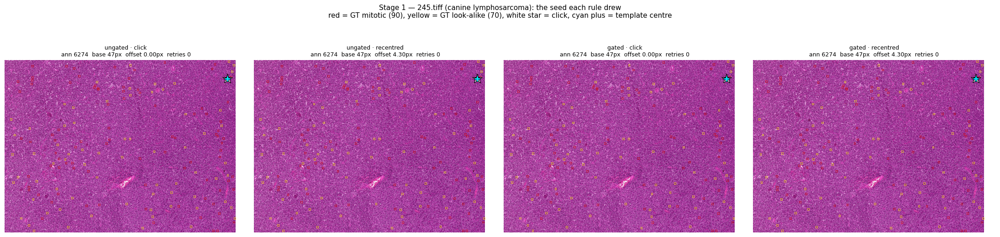

  -> figures/245_stage1_roi_context.png


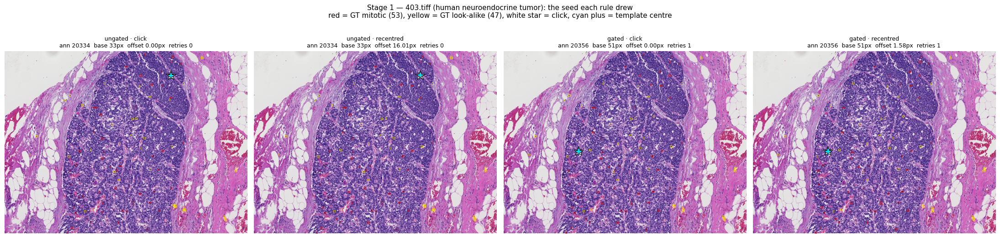

  -> figures/403_stage1_roi_context.png


In [15]:
for roi in ROIS:
    info = ROI_INFO[roi]
    fig, axes = plt.subplots(1, 4, figsize=(22, 6))
    for ax, r in zip(axes, runs_for(roi)):
        overlay_panel(ax, roi, r['pools'][SELF_HIT_PINNED]['det'].head(0), r['click_xy'],
                      r['tpl_xy'], f"{r['rule'].label}\nann {r['seed_ann_id']}  base {r['base_size']}px  "
                                   f"offset {r['offset_px']:.2f}px  retries {r['n_retries']}",
                      top_n=0)
    fig.suptitle(f"Stage 1 — {roi} ({info['domain']}): the seed each rule drew\n"
                 f"red = GT mitotic ({int((info['gt']['category_id'] == ds.MITOTIC).sum())}), "
                 f"yellow = GT look-alike ({int((info['gt']['category_id'] == ds.LOOKALIKE).sum())}), "
                 f"white star = click, cyan plus = template centre", fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage1_roi_context.png')

## Stage 2 — the 51 px seed window, and what Otsu did in it

This is where the two selection rules either agree or diverge. Each row is one *distinct click*
drawn on this ROI. Reading left to right: the RGB crop the pathologist clicked in, the
`gray_inverted` structural channel `tighten_box_otsu` actually runs on, that channel normalised to
`uint8`, the binary Otsu split, and the 8-connected labelling.

On the labelling panel: **green** outlines the component the *click's own pixel* is in (what the
gate uses), **magenta** outlines the *largest* component in the window (what `largest_cc_box` uses).
Where only one outline is visible, they are the same component — which is exactly the 245 case.

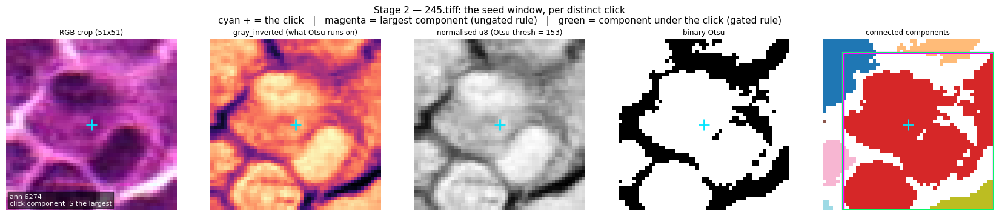

  -> figures/245_stage2_seed_window.png


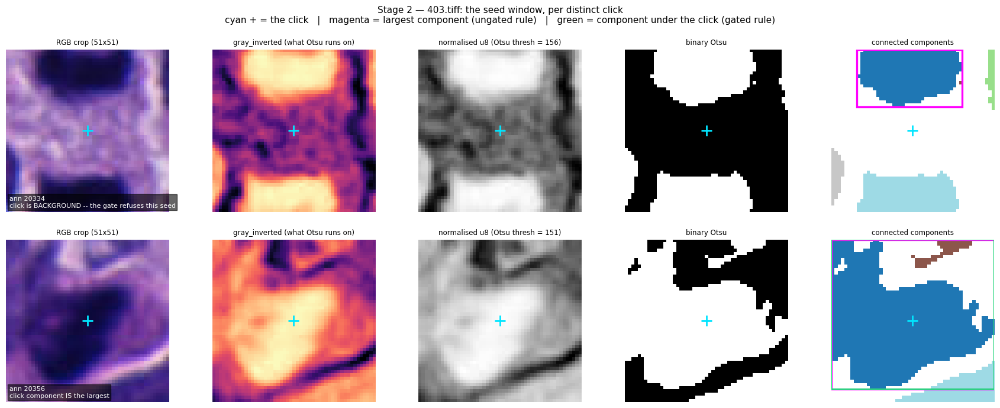

  -> figures/403_stage2_seed_window.png


In [16]:
def draw_box(ax, box, color, lw=1.6, label=None):
    if box is None:
        return
    y0, y1, x0, x1 = box
    ax.add_patch(Rectangle((x0 - 0.5, y0 - 0.5), x1 - x0, y1 - y0, fill=False,
                           edgecolor=color, linewidth=lw, label=label))


for roi in ROIS:
    info = ROI_INFO[roi]
    anns = list(info['diags'].keys())
    fig, axes = plt.subplots(len(anns), 5, figsize=(17, 3.6 * len(anns)), squeeze=False)
    for row, ann in enumerate(anns):
        d = info['diags'][ann]
        cy, cx = d['click_rc']
        panels = [(info['crops'][ann], 'RGB crop (51x51)', None),
                  (d['patch'], 'gray_inverted (what Otsu runs on)', 'magma'),
                  (d['u8'], f"normalised u8 (Otsu thresh = {d['otsu_thresh']:.0f})", 'gray'),
                  (d['binary'], 'binary Otsu', 'gray'),
                  (np.where(d['labels'] > 0, d['labels'], np.nan), 'connected components', 'tab20')]
        for col, (img, title, cmap) in enumerate(panels):
            ax = axes[row][col]
            ax.imshow(img, cmap=cmap, interpolation='nearest')
            ax.plot(cx, cy, marker='+', markersize=13, color='#00e5ff', markeredgewidth=2.0)
            if col == 4:
                draw_box(ax, d['largest_box'], '#ff00ff', 2.4)   # what largest_cc_box picks
                draw_box(ax, d['click_box'], '#00ff66', 1.4)     # what the gate picks
            ax.set_title(title, fontsize=8.5)
            ax.axis('off')
        verdict = ('click is BACKGROUND -- the gate refuses this seed'
                   if d['click_label'] == 0 else
                   ('click component IS the largest' if d['click_label'] == d['largest_label']
                    else 'click component is NOT the largest'))
        axes[row][0].set_ylabel(f'ann {ann}', fontsize=9)
        axes[row][0].text(0.02, 0.02, f'ann {ann}\n{verdict}', transform=axes[row][0].transAxes,
                          fontsize=8, color='white', va='bottom',
                          bbox=dict(facecolor='black', alpha=0.6, pad=2))
    fig.suptitle(f'Stage 2 — {roi}: the seed window, per distinct click\n'
                 f'cyan + = the click   |   magenta = largest component (ungated rule)   |   '
                 f'green = component under the click (gated rule)', fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage2_seed_window.png')

## Stage 3 — the four boxes, on the same crop

The accepted component's bounding box, and the square `base_size` template that box produces, drawn
at each variant's **own centre**. This is the last stage where the difference is still a few pixels
on a thumbnail; everything after it is that difference propagating through a 39-megapixel
correlation.

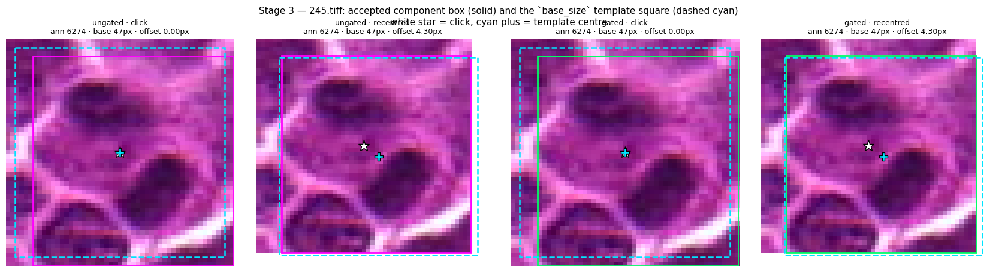

  -> figures/245_stage3_boxes.png


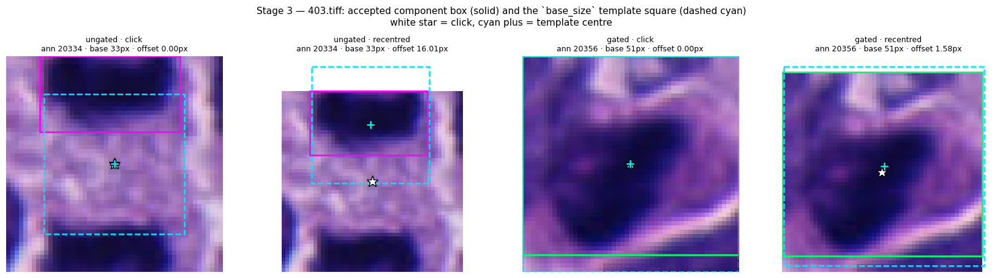

  -> figures/403_stage3_boxes.png


In [17]:
for roi in ROIS:
    info = ROI_INFO[roi]
    fig, axes = plt.subplots(1, 4, figsize=(17, 4.6))
    for ax, r in zip(axes, runs_for(roi)):
        ann = r['seed_ann_id']
        d = info['diags'][ann]
        ax.imshow(info['crops'][ann], interpolation='nearest')
        cy, cx = d['click_rc']
        box = d['click_box'] if r['rule'].gated else d['largest_box']
        draw_box(ax, box, '#00ff66' if r['rule'].gated else '#ff00ff', 2.0)
        # the base_size square, at this variant's own centre, in crop-local coordinates
        half = OTSU_WINDOW // 2
        ix, iy = int(round(r['click_xy'][0])), int(round(r['click_xy'][1]))
        tcx = r['tpl_xy'][0] - (ix - half)
        tcy = r['tpl_xy'][1] - (iy - half)
        b = r['base_size'] / 2.0
        ax.add_patch(Rectangle((tcx - b, tcy - b), r['base_size'], r['base_size'],
                               fill=False, edgecolor='#00e5ff', linewidth=1.8, linestyle='--'))
        ax.plot(cx, cy, marker='*', markersize=14, color='white', markeredgecolor='black')
        ax.plot(tcx, tcy, marker='P', markersize=10, color='#00e5ff', markeredgecolor='black')
        ax.set_title(f"{r['rule'].label}\nann {ann} · base {r['base_size']}px · "
                     f"offset {r['offset_px']:.2f}px", fontsize=9)
        ax.axis('off')
    fig.suptitle(f'Stage 3 — {roi}: accepted component box (solid) and the {chr(96)}base_size{chr(96)} '
                 f'template square (dashed cyan)\nwhite star = click, cyan plus = template centre',
                 fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage3_boxes.png')

## Stage 4 — the templates themselves, and their difference · **headline figure**

These are the arrays handed to `cv2.matchTemplate`: the `base_size` crop of `hematoxylin_od`, cut
from the 73 px rotation-safe patch at each variant's own centre. The bottom row is the signed
pixel difference against the production variant (`gated_click`).

On 245 every variant cuts a 47 px template and the *only* difference is a 4.3 px translation — a
~9% shift of a correlation kernel. Because `TM_CCOEFF` is unnormalised it rewards raw contrast
overlap, so that shift re-scores every one of the ~19,000 surviving peaks. That is the whole causal
chain, and this is the only frame in the notebook where you see it directly.

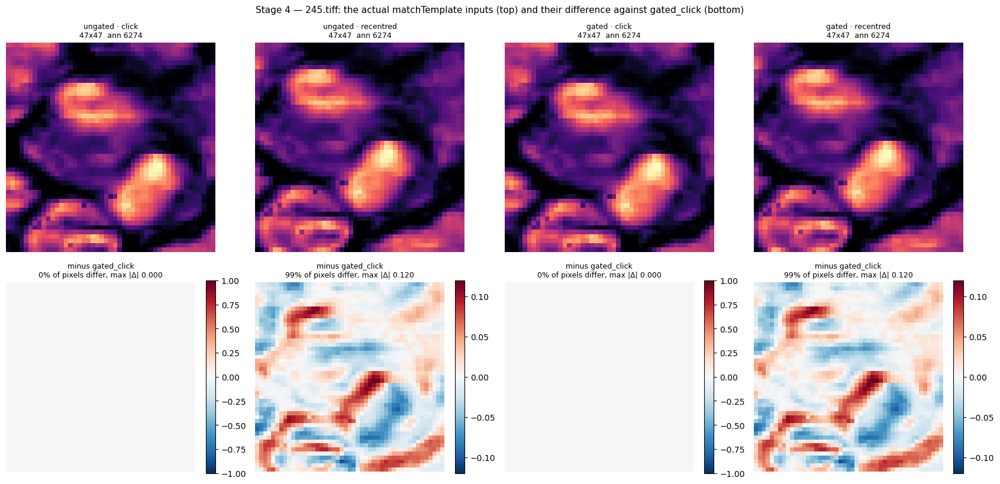

  -> figures/245_stage4_templates.png


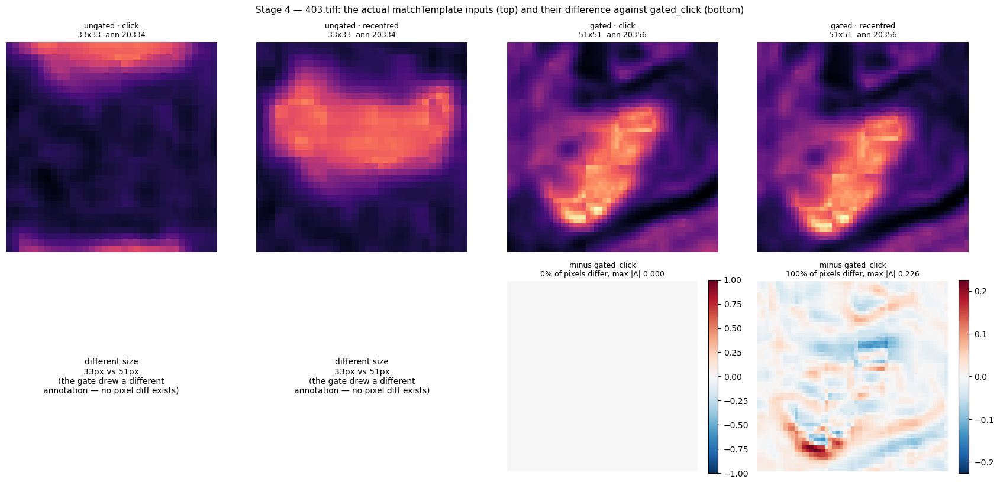

  -> figures/403_stage4_templates.png


In [18]:
REF_VARIANT = 'gated_click'   # production today (D8's 2026-09-09 amendment)

for roi in ROIS:
    ref = RUNS[(roi, REF_VARIANT)]
    ref_t = ref['templates'][0]          # templates[0] is the identity aug: flip=False, angle=0
    fig, axes = plt.subplots(2, 4, figsize=(17, 8.4))
    vmin = min(float(r['templates'][0].min()) for r in runs_for(roi))
    vmax = max(float(r['templates'][0].max()) for r in runs_for(roi))
    for col, r in enumerate(runs_for(roi)):
        t = r['templates'][0]
        ax = axes[0][col]
        ax.imshow(t, cmap='magma', vmin=vmin, vmax=vmax, interpolation='nearest')
        ax.set_title(f"{r['rule'].label}\n{t.shape[0]}x{t.shape[1]}  ann {r['seed_ann_id']}", fontsize=9)
        ax.axis('off')

        ax = axes[1][col]
        if t.shape == ref_t.shape:
            diff = t - ref_t
            dmax = float(np.abs(diff).max())
            lim = dmax if dmax > 0 else 1.0     # an all-zero diff must not report |Δ| = 1
            im = ax.imshow(diff, cmap='RdBu_r', vmin=-lim, vmax=lim, interpolation='nearest')
            frac = float((np.abs(diff) > 1e-6).mean())
            ax.set_title(f'minus {REF_VARIANT}\n{frac:.0%} of pixels differ, max |Δ| {dmax:.3f}',
                         fontsize=9)
            fig.colorbar(im, ax=ax, fraction=0.046)
        else:
            ax.text(0.5, 0.5, f'different size\n{t.shape[0]}px vs {ref_t.shape[0]}px\n'
                              '(the gate drew a different\nannotation — no pixel diff exists)',
                    ha='center', va='center', fontsize=10, transform=ax.transAxes)
        ax.axis('off')
    fig.suptitle(f'Stage 4 — {roi}: the actual matchTemplate inputs (top) and their difference '
                 f'against {REF_VARIANT} (bottom)', fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage4_templates.png')

## Stage 5 — the 8-augmentation bank

What is actually being searched for: 4 rotations × 2 flips at one scale. `fused_response` takes an
element-wise max over these eight maps, which is only honest because they all share a size —
`TM_CCOEFF` scales with pixel count, so a max over a *multi-scale* bank would be decided by size
rather than by fit.

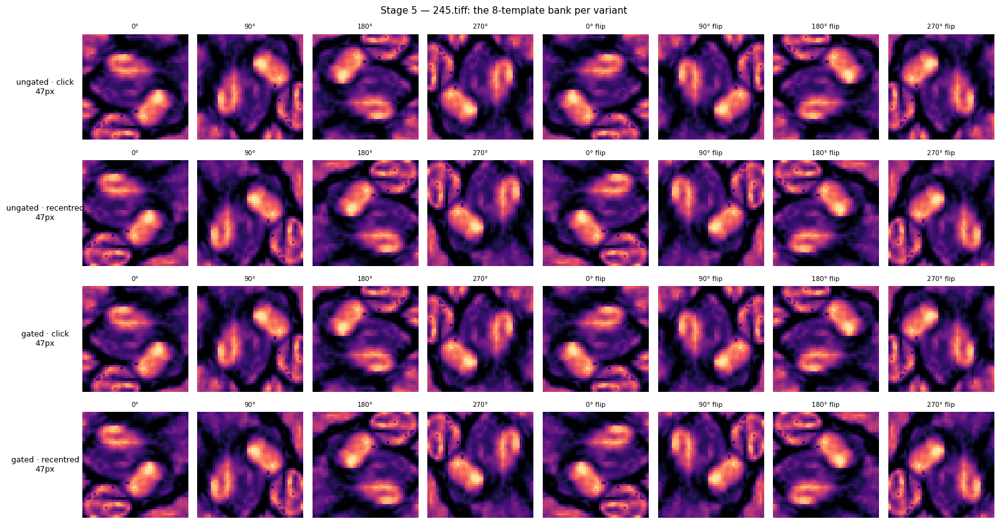

  -> figures/245_stage5_aug_bank.png


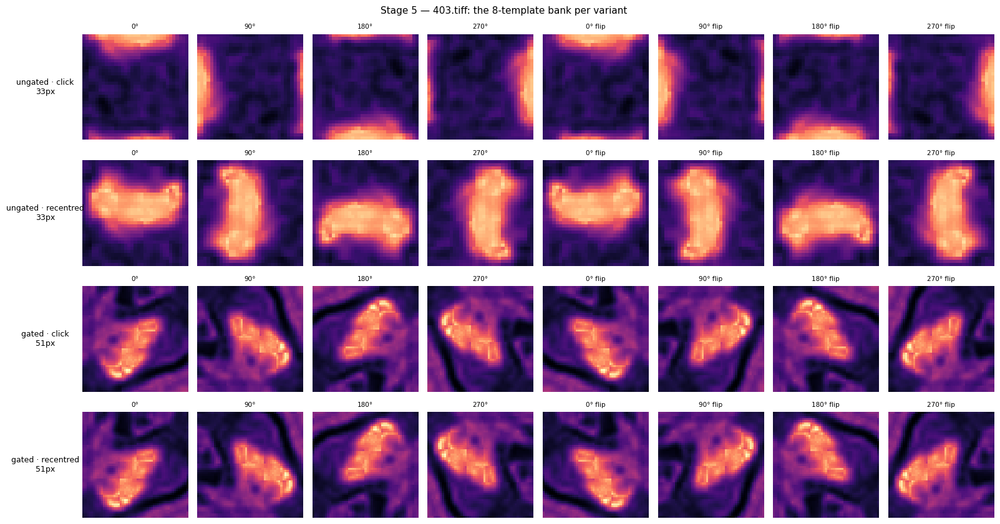

  -> figures/403_stage5_aug_bank.png


In [19]:
for roi in ROIS:
    rs = runs_for(roi)
    fig, axes = plt.subplots(len(rs), 8, figsize=(16, 2.15 * len(rs)), squeeze=False)
    for row, r in enumerate(rs):
        vmin, vmax = float(r['patch73'].min()), float(r['patch73'].max())
        for col, (t, m) in enumerate(zip(r['templates'], r['metas'])):
            ax = axes[row][col]
            ax.imshow(t, cmap='magma', vmin=vmin, vmax=vmax, interpolation='nearest')
            ax.set_title(f'{m.angle:.0f}°{" flip" if m.flip else ""}', fontsize=7.5)
            ax.axis('off')
        axes[row][0].text(-0.35, 0.5, f"{r['rule'].label}\n{r['base_size']}px",
                          transform=axes[row][0].transAxes, fontsize=9, ha='center', va='center')
    fig.suptitle(f'Stage 5 — {roi}: the 8-template bank per variant', fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage5_aug_bank.png')

## Stage 6 — the fused response map

The top row is each variant's fused map in per-map z units, `(score − median) / MAD`, so the four
are on a comparable scale despite `TM_CCOEFF` being unnormalised. The second row is the signed
difference against the production variant. The third row is `best_aug` — which of the eight
augmentations won at each pixel — and the last panel is the z-histogram with the deep extraction
floor marked.

A 4 px template shift produces a map that looks identical at this zoom and is *not* identical: the
difference panel is where the re-scoring lives.

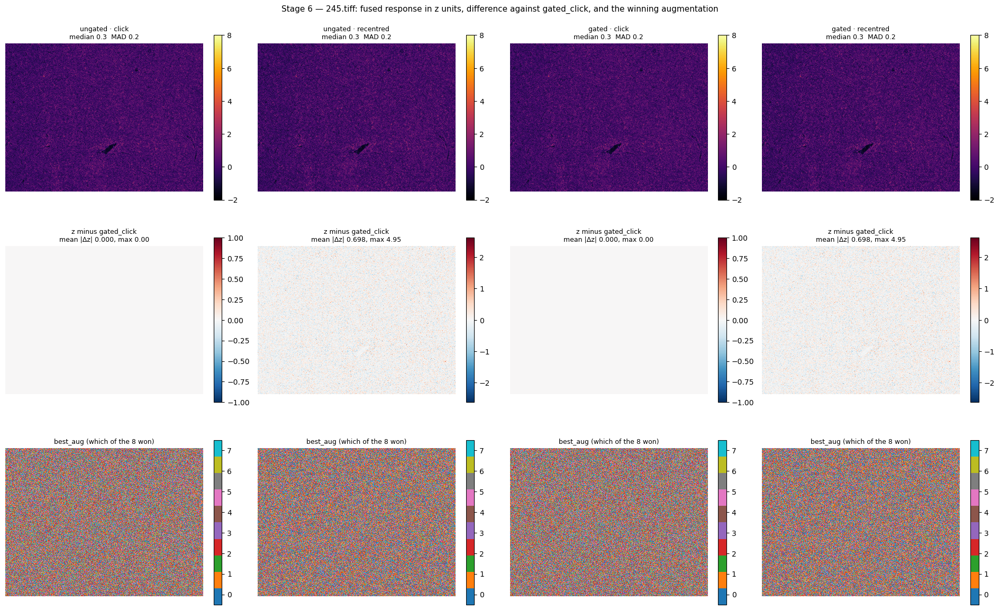

  -> figures/245_stage6_response.png


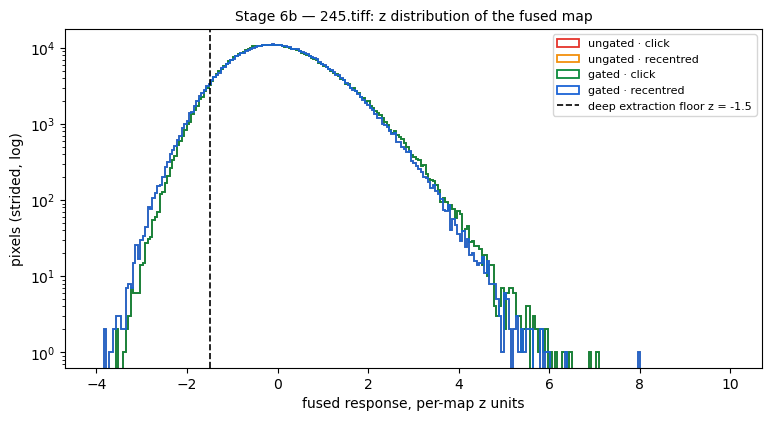

  -> figures/245_stage6b_z_hist.png


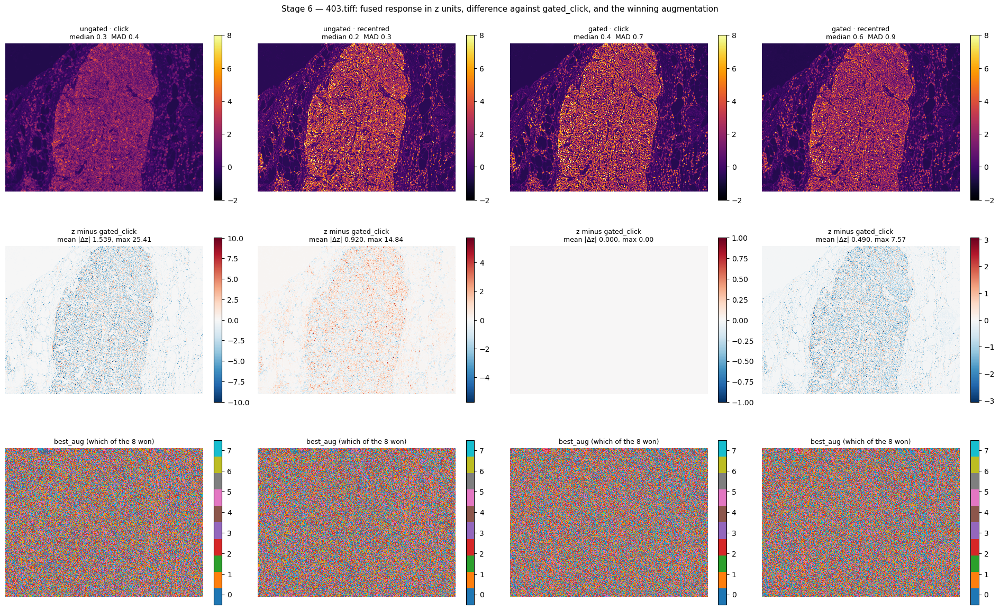

  -> figures/403_stage6_response.png


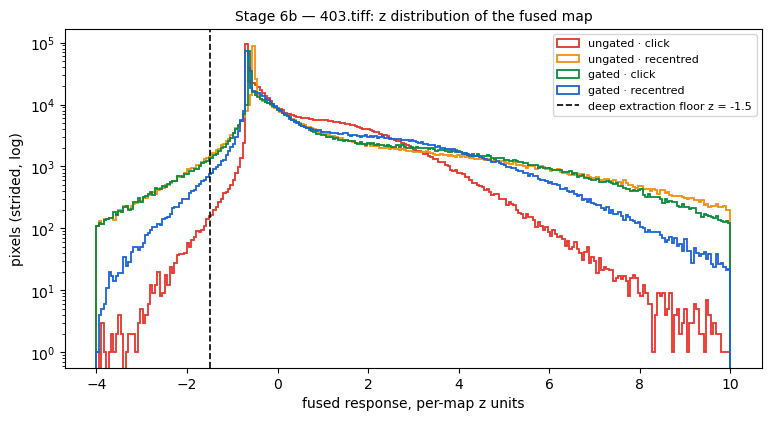

  -> figures/403_stage6b_z_hist.png


In [20]:
for roi in ROIS:
    rs = runs_for(roi)
    ref = RUNS[(roi, REF_VARIANT)]
    ref_z = (ref['fused_s'] - ref['med']) / ref['mad']
    fig, axes = plt.subplots(3, 4, figsize=(19, 12))
    for col, r in enumerate(rs):
        z = (r['fused_s'] - r['med']) / r['mad']
        ax = axes[0][col]
        im = ax.imshow(z, cmap='inferno', vmin=-2, vmax=8)
        ax.set_title(f"{r['rule'].label}\nmedian {r['med']:.1f}  MAD {r['mad']:.1f}", fontsize=9)
        ax.axis('off')
        fig.colorbar(im, ax=ax, fraction=0.038)

        ax = axes[1][col]
        d = z - ref_z
        lim = float(np.percentile(np.abs(d), 99.5)) or 1.0
        im = ax.imshow(d, cmap='RdBu_r', vmin=-lim, vmax=lim)
        ax.set_title(f'z minus {REF_VARIANT}\nmean |Δz| {np.abs(d).mean():.3f}, '
                     f'max {np.abs(d).max():.2f}', fontsize=9)
        ax.axis('off')
        fig.colorbar(im, ax=ax, fraction=0.038)

        ax = axes[2][col]
        im = ax.imshow(r['best_s'], cmap='tab10', vmin=-0.5, vmax=7.5, interpolation='nearest')
        ax.set_title('best_aug (which of the 8 won)', fontsize=9)
        ax.axis('off')
        fig.colorbar(im, ax=ax, fraction=0.038, ticks=range(8))
    fig.suptitle(f'Stage 6 — {roi}: fused response in z units, difference against '
                 f'{REF_VARIANT}, and the winning augmentation', fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage6_response.png')

    fig, ax = plt.subplots(figsize=(9, 4.4))
    for r in rs:
        z = ((r['fused_s'] - r['med']) / r['mad']).ravel()
        ax.hist(z, bins=260, range=(-4, 10), histtype='step', lw=1.3,
                color=VAR_COLOR[r['variant']], label=r['rule'].label)
    ax.axvline(DEEP_FLOOR_Z, color='black', ls='--', lw=1.2,
               label=f'deep extraction floor z = {DEEP_FLOOR_Z}')
    ax.set_yscale('log')
    ax.set_xlabel('fused response, per-map z units')
    ax.set_ylabel('pixels (strided, log)')
    ax.legend(fontsize=8)
    ax.set_title(f'Stage 6b — {roi}: z distribution of the fused map', fontsize=10)
    savefig(fig, f'{roi.replace(".tiff", "")}_stage6b_z_hist.png')

## Stage 7 — peaks, then NMS, then self-hit removal

Where the candidate count comes from. `extract_peaks` takes local maxima above the deep floor,
`nms_by_distance` thins them at the match radius (D7), and `suppress` drops the template's own
self-correlation. The scatter shows where the surviving top 500 sit — a shifted template does not
merely re-rank the same points, it produces a *different peak set*.

,roi,variant,base_size,peaks_above_floor,after_nms,after_self_hit,seed_annulus
0,245.tiff,ungated_click,47,86353,19192,19191,0
1,245.tiff,ungated_recentred,47,76233,18791,18790,0
2,245.tiff,gated_click,47,86353,19192,19191,0
3,245.tiff,gated_recentred,47,76233,18791,18790,0
4,403.tiff,ungated_click,33,58487,17237,17236,0
5,403.tiff,ungated_recentred,33,44919,17154,17153,0
6,403.tiff,gated_click,51,35985,16690,16689,0
7,403.tiff,gated_recentred,51,39328,16407,16406,0


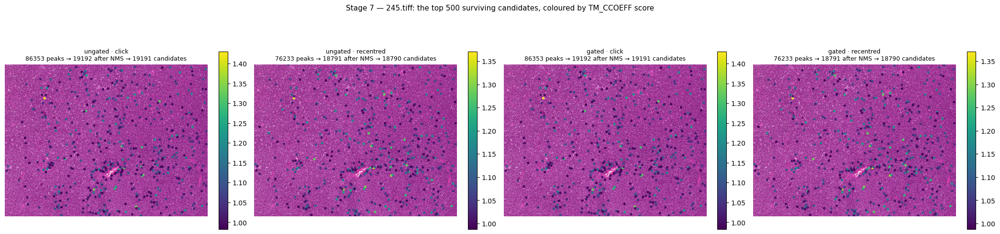

  -> figures/245_stage7_peaks.png


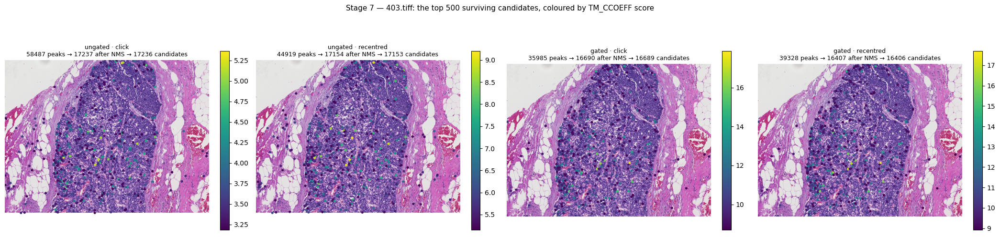

  -> figures/403_stage7_peaks.png


In [21]:
counts = pd.DataFrame([
    dict(roi=r['roi'], variant=r['variant'], base_size=r['base_size'],
         peaks_above_floor=r['n_peaks'], after_nms=r['n_after_nms'],
         after_self_hit=len(r['pools'][SELF_HIT_PINNED]['det']),
         seed_annulus=r['annulus'][SELF_HIT_PINNED])
    for r in RUNS.values()])
display(counts)

for roi in ROIS:
    fig, axes = plt.subplots(1, 4, figsize=(21, 5.6))
    for ax, r in zip(axes, runs_for(roi)):
        det = r['pools'][SELF_HIT_PINNED]['det'].head(500)
        ax.imshow(ROI_INFO[roi]['rgb_small'])
        sc = ax.scatter(det['cx'] / DS, det['cy'] / DS, c=det['score'], s=7, cmap='viridis')
        ax.set_title(f"{r['rule'].label}\n{r['n_peaks']} peaks → {r['n_after_nms']} after NMS "
                     f"→ {len(r['pools'][SELF_HIT_PINNED]['det'])} candidates", fontsize=9)
        ax.axis('off')
        fig.colorbar(sc, ax=ax, fraction=0.04)
    fig.suptitle(f'Stage 7 — {roi}: the top 500 surviving candidates, coloured by TM_CCOEFF score',
                 fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage7_peaks.png')

## Stage 8 — the top 50, in the three buckets the repo actually uses

Not TP/FP. `evaluate.py` splits false positives into two, and the split is the diagnostic:

- **`human_correct_label`** — matched a category-1 GT. A real mitotic figure found from one click.
- **`human_rejected_label`** — matched a category-2 GT. A structure a pathologist *examined and
  rejected*. The algorithm is being fooled by exactly what fools a human.
- **`non_human_findings`** — matched nothing annotated at all.

Both of the latter are false positives for the task, but on a lymphosarcoma ROI with 89 mitotic GT,
whether a template shift moves detections onto *annotated look-alikes* or onto unannotated tissue is
a completely different mechanism, and a two-colour scheme hides it.

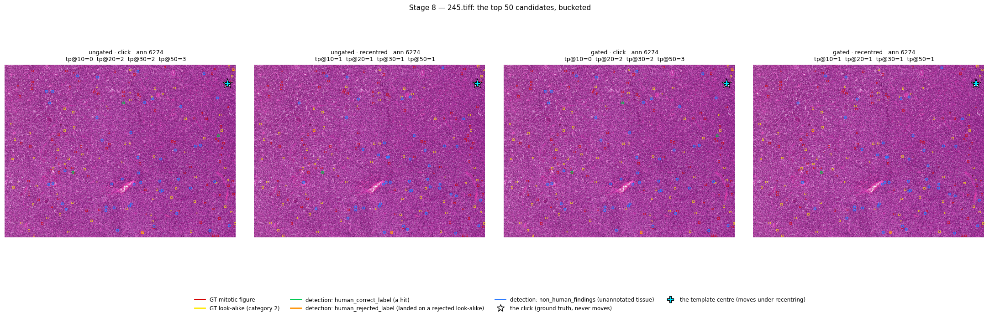

  -> figures/245_stage8_top50.png


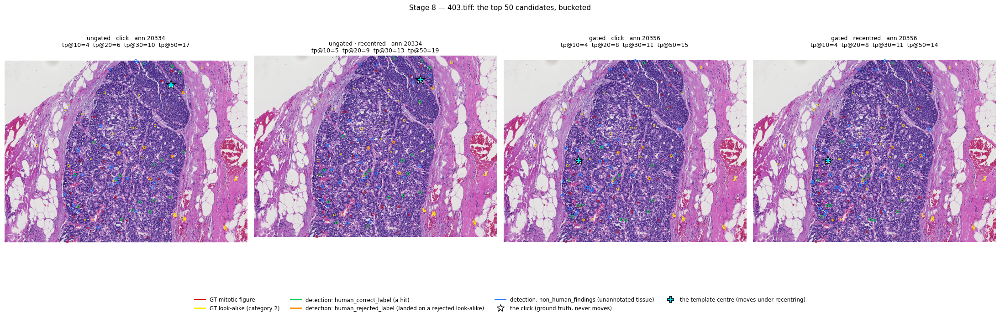

  -> figures/403_stage8_top50.png


In [22]:
for roi in ROIS:
    fig, axes = plt.subplots(1, 4, figsize=(22, 6.4))
    for ax, r in zip(axes, runs_for(roi)):
        det = r['pools'][SELF_HIT_PINNED]['det']
        e = r['evals'][SELF_HIT_PINNED]
        tps = {k: int(e.loc[e['budget'] == k, 'tp_at_budget'].iloc[0]) for k in BUDGETS}
        overlay_panel(ax, roi, det, r['click_xy'], r['tpl_xy'],
                      f"{r['rule'].label}   ann {r['seed_ann_id']}\n"
                      + '  '.join(f'tp@{k}={tps[k]}' for k in BUDGETS), top_n=50)
    fig.legend(handles=bucket_legend(), loc='lower center', ncol=4, fontsize=8.5,
               frameon=False, bbox_to_anchor=(0.5, -0.09))
    fig.suptitle(f'Stage 8 — {roi}: the top 50 candidates, bucketed', fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage8_top50.png')

## Stage 9 — where in the ranking the hits sit

One row per variant, 50 cells, in rank order. A budget of K is a truncation of this strip at K, so
`tp@K` is just "how many green cells are left of the cut". Two variants can have the same `tp@50`
and be completely different products to use, if one puts its hits at ranks 2, 5, 9 and the other at
ranks 41, 47, 50.

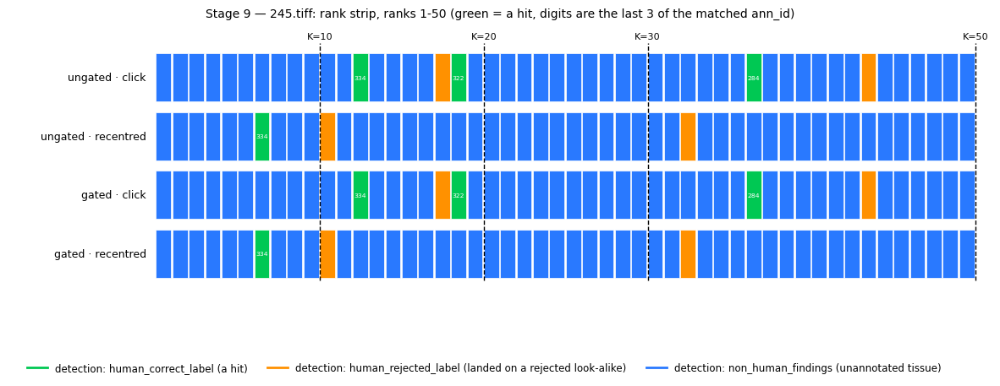

  -> figures/245_stage9_rank_strip.png


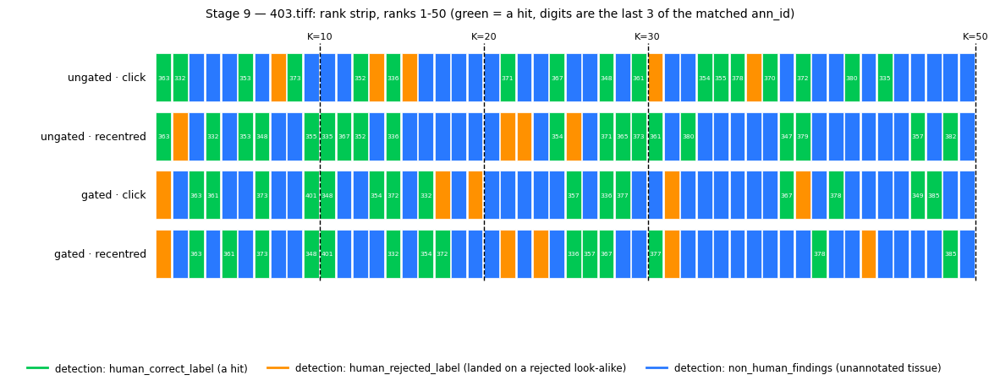

  -> figures/403_stage9_rank_strip.png


In [23]:
BUCKET_ORDER = [ev.HUMAN_CORRECT_LABEL, ev.HUMAN_REJECTED_LABEL, ev.NON_HUMAN_FINDINGS]

for roi in ROIS:
    rs = runs_for(roi)
    fig, ax = plt.subplots(figsize=(15, 0.62 * len(rs) + 1.6))
    for row, r in enumerate(rs):
        det = r['pools'][SELF_HIT_PINNED]['det'].head(50)
        for i, (_, d) in enumerate(det.iterrows()):
            ax.add_patch(Rectangle((i, -row), 0.92, 0.82,
                                   facecolor=viz.BUCKET_COLORS[d['bucket']],
                                   edgecolor='white', linewidth=0.5))
            if d['bucket'] == ev.HUMAN_CORRECT_LABEL:
                ax.text(i + 0.46, -row + 0.41, str(int(d['matched_ann_id']))[-3:],
                        ha='center', va='center', fontsize=5.5, color='white')
        ax.text(-0.6, -row + 0.41, r['rule'].label, ha='right', va='center', fontsize=9)
    for k in BUDGETS:
        ax.plot([k, k], [-(len(rs) - 1) - 0.05, 1.0], color='black', lw=1.0, ls='--')
        ax.text(k, 1.06, f'K={k}', ha='center', fontsize=8)
    ax.set_xlim(-9, 51)
    ax.set_ylim(-(len(rs) - 1) - 0.2, 1.32)
    ax.axis('off')
    ax.set_title(f'Stage 9 — {roi}: rank strip, ranks 1-50 (green = a hit, digits are the last 3 '
                 f'of the matched ann_id)', fontsize=10)
    fig.legend(handles=bucket_legend()[2:5], loc='lower center', ncol=3, fontsize=8.5,
               frameon=False, bbox_to_anchor=(0.5, -0.16))
    savefig(fig, f'{roi.replace(".tiff", "")}_stage9_rank_strip.png')

## Stage 10 — what the top 10 actually are

The candidate crops themselves, at the same 51 px window the seed was cut from. Border colour is
the bucket; the caption carries rank, z and — for hits — which annotation was claimed.

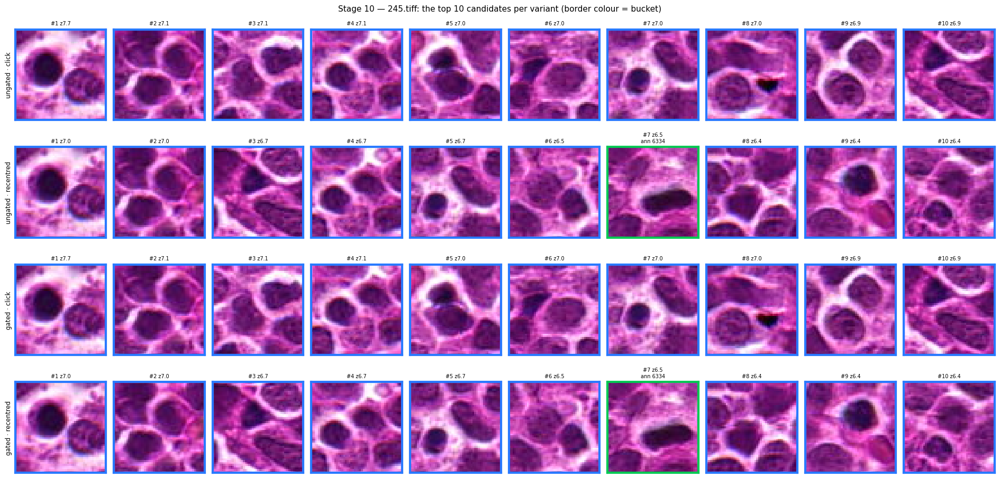

  -> figures/245_stage10_top10_crops.png


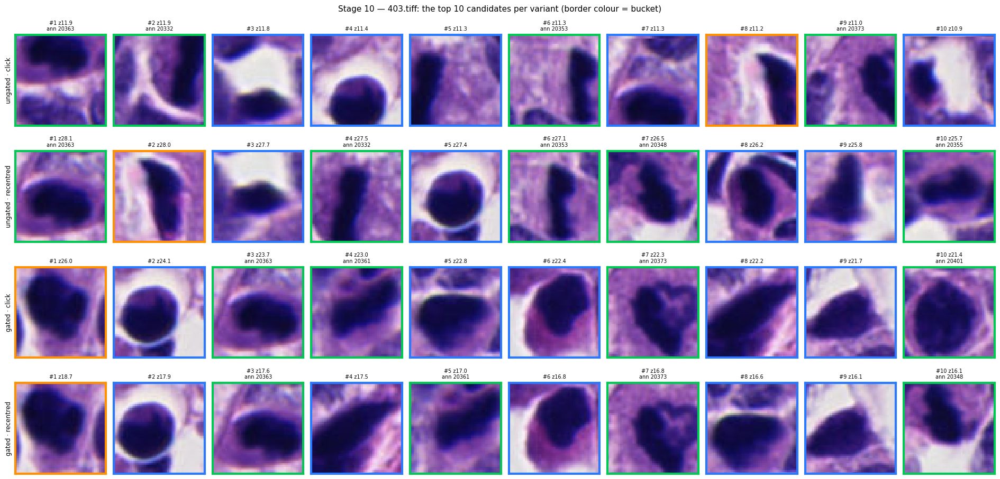

  -> figures/403_stage10_top10_crops.png


In [24]:
for roi in ROIS:
    rs = runs_for(roi)
    fig, axes = plt.subplots(len(rs), 10, figsize=(19, 2.35 * len(rs)), squeeze=False)
    for row, r in enumerate(rs):
        det = r['pools'][SELF_HIT_PINNED]['det'].head(10)
        for col, (_, d) in enumerate(det.iterrows()):
            ax = axes[row][col]
            ax.imshow(crop_rgb(roi, d['cx'], d['cy'], OTSU_WINDOW), interpolation='nearest')
            for sp in ax.spines.values():
                sp.set_edgecolor(viz.BUCKET_COLORS[d['bucket']])
                sp.set_linewidth(3.0)
            ax.set_xticks([]); ax.set_yticks([])
            z = (d['score'] - r['med']) / r['mad']
            tag = f"#{int(d['rank'])} z{z:.1f}"
            if d['bucket'] == ev.HUMAN_CORRECT_LABEL:
                tag += f"\nann {int(d['matched_ann_id'])}"
            ax.set_title(tag, fontsize=7)
        axes[row][0].set_ylabel(r['rule'].label, fontsize=8.5)
    fig.suptitle(f'Stage 10 — {roi}: the top 10 candidates per variant '
                 f'(border colour = bucket)', fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage10_top10_crops.png')

## Stage 11 — which annotations were claimed, per variant and per budget

`tp@20 = 3` and `tp@20 = 1` are not comparable until you know whether the 1 is a *subset* of the 3.
This table names the annotations.

**On 403, only the WITHIN-PAIR comparisons are clean.** The gate changed the draw here, so the
ungated and gated arms differ in *three* ways at once — a different seed annotation (20334 vs
20356), a different template size (33 vs 51 px), and a different centre — and they score against
different `gt_eval`: each excludes its own seed, so both leave 52 scoreable mitotic GT but not the
*same* 52. Reading `ungated_recentred` against `gated_click` therefore ranks four things at once,
not centring.

The comparisons that isolate centring on 403 are **within** each pair — `ungated_click →
ungated_recentred` and `gated_click → gated_recentred` — where the seed, the size and the ground
truth are all held fixed and only the centre moves. On 245, where the gate is inert and all four
arms share one seed and one size, every arm is directly comparable to every other.

In [25]:
def hit_anns(r, k, shr=SELF_HIT_PINNED):
    d = r['pools'][shr]['det'].head(k)
    return list(d.loc[d['bucket'] == ev.HUMAN_CORRECT_LABEL, 'matched_ann_id'].astype(int))


rows = []
for (roi, var), r in RUNS.items():
    row = dict(roi=roi, variant=var, seed_ann_id=r['seed_ann_id'],
               excluded_from_gt_eval=r['seed_ann_id'], n_gt_scoreable=r['n_gt_mitotic'])
    for k in BUDGETS:
        h = hit_anns(r, k)
        row[f'tp@{k}'] = len(h)
        row[f'anns@{k}'] = h
    rows.append(row)
TRACE = pd.DataFrame(rows).sort_values(['roi', 'variant'])
TRACE.to_csv(f'{ARTDIR}/hit_trace.csv', index=False)
display(TRACE)

# The 403 caveat, made concrete: is each pair's excluded annotation findable by the other pair?
print('\n403.tiff -- can each pair find the annotation the other pair had to exclude?')
for var in ('ungated_click', 'gated_click'):
    r = RUNS[('403.tiff', var)]
    other = RUNS[('403.tiff', 'gated_click' if var == 'ungated_click' else 'ungated_click')]
    target = other['seed_ann_id']
    d = r['pools'][SELF_HIT_PINNED]['det']
    hit = d[d['matched_ann_id'] == target]
    where = f"rank {int(hit['rank'].iloc[0])}" if len(hit) else 'never matched in the full list'
    print(f"  {var:16s} (excludes {r['seed_ann_id']}) finds the other pair's seed {target}: {where}")

,roi,variant,seed_ann_id,excluded_from_gt_eval,n_gt_scoreable,tp@10,anns@10,tp@20,anns@20,tp@30,anns@30,tp@50,anns@50
2,245.tiff,gated_click,6274,6274,89,0,[],2,"[6334, 6322]",2,"[6334, 6322]",3,"[6334, 6322, 6284]"
3,245.tiff,gated_recentred,6274,6274,89,1,[6334],1,[6334],1,[6334],1,[6334]
0,245.tiff,ungated_click,6274,6274,89,0,[],2,"[6334, 6322]",2,"[6334, 6322]",3,"[6334, 6322, 6284]"
1,245.tiff,ungated_recentred,6274,6274,89,1,[6334],1,[6334],1,[6334],1,[6334]
6,403.tiff,gated_click,20356,20356,52,4,"[20363, 20361, 20373, 20401]",8,"[20363, 20361, 20373, 20401, 20348, 20354, 203...",11,"[20363, 20361, 20373, 20401, 20348, 20354, 203...",15,"[20363, 20361, 20373, 20401, 20348, 20354, 203..."
7,403.tiff,gated_recentred,20356,20356,52,4,"[20363, 20361, 20373, 20348]",8,"[20363, 20361, 20373, 20348, 20401, 20332, 203...",11,"[20363, 20361, 20373, 20348, 20401, 20332, 203...",14,"[20363, 20361, 20373, 20348, 20401, 20332, 203..."
4,403.tiff,ungated_click,20334,20334,52,4,"[20363, 20332, 20353, 20373]",6,"[20363, 20332, 20353, 20373, 20352, 20336]",10,"[20363, 20332, 20353, 20373, 20352, 20336, 203...",17,"[20363, 20332, 20353, 20373, 20352, 20336, 203..."
5,403.tiff,ungated_recentred,20334,20334,52,5,"[20363, 20332, 20353, 20348, 20355]",9,"[20363, 20332, 20353, 20348, 20355, 20335, 203...",13,"[20363, 20332, 20353, 20348, 20355, 20335, 203...",19,"[20363, 20332, 20353, 20348, 20355, 20335, 203..."



403.tiff -- can each pair find the annotation the other pair had to exclude?
  ungated_click    (excludes 20334) finds the other pair's seed 20356: rank 73
  gated_click      (excludes 20356) finds the other pair's seed 20334: rank 167


## Stage 12 — rank churn

Detections are matched between variants by position (nearest within `PEAK_MIN_DISTANCE` px), then
their ranks compared. Points off the diagonal are candidates the shift promoted or demoted; points
on an axis are candidates one variant found and the other did not produce at all.

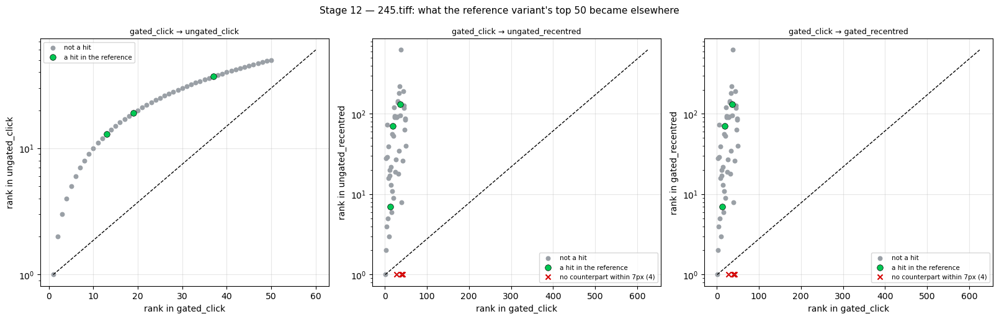

  -> figures/245_stage12_rank_churn.png


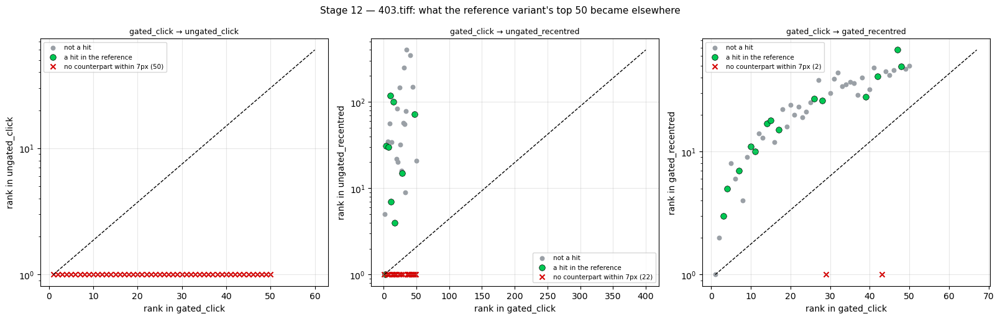

  -> figures/403_stage12_rank_churn.png


In [26]:
from sklearn.neighbors import KDTree


def churn(roi, var_a, var_b, top=50, tol=PEAK_MIN_DISTANCE):
    '''Match var_a's top-`top` detections to var_b's full pool by position.'''
    a = RUNS[(roi, var_a)]['pools'][SELF_HIT_PINNED]['det'].head(top)
    b = RUNS[(roi, var_b)]['pools'][SELF_HIT_PINNED]['det']
    tree = KDTree(b[['cx', 'cy']].to_numpy())
    dist, idx = tree.query(a[['cx', 'cy']].to_numpy(), k=1)
    rows = []
    for (_, d), dd, ii in zip(a.iterrows(), dist[:, 0], idx[:, 0]):
        m = b.iloc[int(ii)]
        rows.append(dict(rank_a=int(d['rank']), bucket_a=d['bucket'],
                         ann_a=int(d['matched_ann_id']),
                         rank_b=int(m['rank']) if dd <= tol else np.nan,
                         bucket_b=m['bucket'] if dd <= tol else None,
                         dist_px=round(float(dd), 2)))
    return pd.DataFrame(rows)


for roi in ROIS:
    others = [v.name for v in VARIANTS if v.name != REF_VARIANT]
    fig, axes = plt.subplots(1, len(others), figsize=(5.4 * len(others), 5.2))
    for ax, var in zip(np.atleast_1d(axes), others):
        c = churn(roi, REF_VARIANT, var)
        hit = c['bucket_a'] == ev.HUMAN_CORRECT_LABEL
        lost = c['rank_b'].isna()
        ax.scatter(c.loc[~hit & ~lost, 'rank_a'], c.loc[~hit & ~lost, 'rank_b'],
                   s=22, color='#9aa0a6', label='not a hit')
        ax.scatter(c.loc[hit & ~lost, 'rank_a'], c.loc[hit & ~lost, 'rank_b'],
                   s=48, color=viz.BUCKET_COLORS[ev.HUMAN_CORRECT_LABEL], edgecolor='black',
                   linewidth=0.5, label='a hit in the reference')
        n_lost = int(lost.sum())
        if n_lost:
            ax.scatter(c.loc[lost, 'rank_a'], np.full(n_lost, 1.0), s=34, marker='x',
                       color='#d50000', label=f'no counterpart within {PEAK_MIN_DISTANCE}px ({n_lost})')
        lim = max(60, float(np.nanmax(c['rank_b'].to_numpy(dtype=float), initial=60)))
        ax.plot([1, lim], [1, lim], ls='--', lw=1, color='black')
        ax.set_yscale('log'); ax.set_xlabel(f'rank in {REF_VARIANT}')
        ax.set_ylabel(f'rank in {var}')
        ax.set_title(f'{REF_VARIANT} → {var}', fontsize=9)
        ax.legend(fontsize=7.5)
        ax.grid(alpha=0.3)
    fig.suptitle(f'Stage 12 — {roi}: what the reference variant\'s top 50 became elsewhere',
                 fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage12_rank_churn.png')

## Stage 13 — the question this notebook was opened to answer

*"Why does one variant give 1/10 and the other two don't?"*

The cell below computes it rather than asserting it: for every budget and every variant, which
annotations were **gained** and which were **lost** against the production variant. Then it shows
the crops of the annotations that changed hands, with each one's rank and score under all four
variants and its distance from each template centre.

In [27]:
delta_rows = []
for roi in ROIS:
    ref = RUNS[(roi, REF_VARIANT)]
    for v in VARIANTS:
        if v.name == REF_VARIANT:
            continue
        r = RUNS[(roi, v.name)]
        for k in BUDGETS:
            a, b = set(hit_anns(ref, k)), set(hit_anns(r, k))
            delta_rows.append(dict(roi=roi, variant=v.name, budget=k,
                                   tp_ref=len(a), tp_var=len(b), delta=len(b) - len(a),
                                   gained=sorted(b - a), lost=sorted(a - b)))
DELTA = pd.DataFrame(delta_rows)
DELTA.to_csv(f'{ARTDIR}/hit_delta.csv', index=False)
display(DELTA)

CHANGED = {}
for roi in ROIS:
    anns = sorted({a for _, x in DELTA[DELTA['roi'] == roi].iterrows()
                   for a in list(x['gained']) + list(x['lost'])})
    CHANGED[roi] = anns
    print(f'{roi}: {len(anns)} annotation(s) change hands across the four variants -> {anns}')

,roi,variant,budget,tp_ref,tp_var,delta,gained,lost
0,245.tiff,ungated_click,10,0,0,0,[],[]
1,245.tiff,ungated_click,20,2,2,0,[],[]
2,245.tiff,ungated_click,30,2,2,0,[],[]
3,245.tiff,ungated_click,50,3,3,0,[],[]
4,245.tiff,ungated_recentred,10,0,1,1,[6334],[]
5,245.tiff,ungated_recentred,20,2,1,-1,[],[6322]
6,245.tiff,ungated_recentred,30,2,1,-1,[],[6322]
7,245.tiff,ungated_recentred,50,3,1,-2,[],"[6284, 6322]"
8,245.tiff,gated_recentred,10,0,1,1,[6334],[]
9,245.tiff,gated_recentred,20,2,1,-1,[],[6322]


245.tiff: 3 annotation(s) change hands across the four variants -> [6284, 6322, 6334]
403.tiff: 25 annotation(s) change hands across the four variants -> [20332, 20335, 20336, 20347, 20348, 20349, 20352, 20353, 20354, 20355, 20357, 20361, 20365, 20367, 20370, 20371, 20372, 20373, 20377, 20378, 20379, 20380, 20382, 20385, 20401]


In [28]:
# The answer in one line per variant, computed from DELTA rather than read off a chart.
print(f'Reference variant: {REF_VARIANT} (the production path today, DECISIONS.md D8 amendment)')
for roi in ROIS:
    print(f'\n--- {roi}')
    for v in VARIANTS:
        if v.name == REF_VARIANT:
            continue
        d = DELTA[(DELTA['roi'] == roi) & (DELTA['variant'] == v.name)].set_index('budget')
        bits = []
        for k in BUDGETS:
            x = d.loc[k]
            tag = f"K={k}: {int(x['tp_ref'])}->{int(x['tp_var'])}"
            if list(x['gained']):
                tag += f" +{list(x['gained'])}"
            if list(x['lost']):
                tag += f" -{list(x['lost'])}"
            bits.append(tag)
        print(f'  {v.name:18s} ' + '   '.join(bits))

Reference variant: gated_click (the production path today, DECISIONS.md D8 amendment)

--- 245.tiff
  ungated_click      K=10: 0->0   K=20: 2->2   K=30: 2->2   K=50: 3->3
  ungated_recentred  K=10: 0->1 +[6334]   K=20: 2->1 -[6322]   K=30: 2->1 -[6322]   K=50: 3->1 -[6284, 6322]
  gated_recentred    K=10: 0->1 +[6334]   K=20: 2->1 -[6322]   K=30: 2->1 -[6322]   K=50: 3->1 -[6284, 6322]

--- 403.tiff
  ungated_click      K=10: 4->4 +[20332, 20353] -[20361, 20401]   K=20: 8->6 +[20336, 20352, 20353] -[20348, 20354, 20361, 20372, 20401]   K=30: 11->10 +[20352, 20353, 20367, 20371] -[20354, 20357, 20372, 20377, 20401]   K=50: 15->17 +[20335, 20352, 20353, 20355, 20370, 20371, 20380] -[20349, 20357, 20377, 20385, 20401]
  ungated_recentred  K=10: 4->5 +[20332, 20348, 20353, 20355] -[20361, 20373, 20401]   K=20: 8->9 +[20335, 20336, 20352, 20353, 20355, 20367] -[20354, 20361, 20372, 20373, 20401]   K=30: 11->13 +[20335, 20352, 20353, 20355, 20365, 20367, 20371] -[20357, 20361, 20372, 20377, 


=== 245.tiff  annotation 6284


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,37,1.2,5.982,,3013.1
1,ungated_recentred,132,1.1,5.213,,3016.1
2,gated_click,37,1.2,5.982,,3013.1
3,gated_recentred,132,1.1,5.213,,3016.1



=== 245.tiff  annotation 6322


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,19,1.2,6.334,,1511.3
1,ungated_recentred,71,1.1,5.511,,1509.5
2,gated_click,19,1.2,6.334,,1511.3
3,gated_recentred,71,1.1,5.511,,1509.5



=== 245.tiff  annotation 6334


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,13,1.3,6.693,,5079.8
1,ungated_recentred,7,1.3,6.459,,5081.6
2,gated_click,13,1.3,6.693,,5079.8
3,gated_recentred,7,1.3,6.459,,5081.6


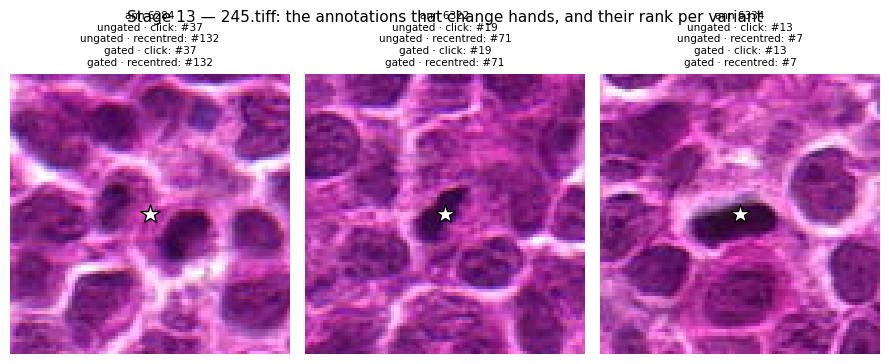

  -> figures/245_stage13_changed_anns.png

=== 403.tiff  annotation 20332


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,2,5.4,11.889,,1003.1
1,ungated_recentred,4,9.0,27.456,,992.7
2,gated_click,17,13.7,19.809,,3472.7
3,gated_recentred,15,14.2,14.948,,3471.2



=== 403.tiff  annotation 20335


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,45,4.3,9.396,,448.1
1,ungated_recentred,11,8.4,25.638,,436.0
2,gated_click,99,11.2,16.095,,3965.9
3,gated_recentred,109,11.2,11.657,,3964.5



=== 403.tiff  annotation 20336


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,15,4.8,10.476,,567.3
1,ungated_recentred,15,8.2,24.929,,551.4
2,gated_click,28,13.0,18.702,,3952.8
3,gated_recentred,26,13.4,13.968,,3951.4



=== 403.tiff  annotation 20347


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,280,3.4,7.348,,656.0
1,ungated_recentred,39,7.4,22.342,,672.0
2,gated_click,1030,7.8,11.025,,3151.6
3,gated_recentred,1408,7.6,7.654,,3150.4



=== 403.tiff  annotation 20348


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,28,4.6,10.096,,2846.7
1,ungated_recentred,7,8.7,26.529,,2855.8
2,gated_click,11,14.7,21.240,,702.8
3,gated_recentred,10,15.3,16.101,,701.3



=== 403.tiff  annotation 20349


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,74,4.1,8.925,,2758.7
1,ungated_recentred,72,6.7,20.332,,2769.2
2,gated_click,47,12.4,17.794,,783.2
3,gated_recentred,67,11.9,12.424,,782.0



=== 403.tiff  annotation 20352


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,13,4.9,10.807,,2034.5
1,ungated_recentred,13,8.2,25.001,,2050.3
2,gated_click,800,8.1,11.449,,3084.2
3,gated_recentred,865,8.2,8.362,,3083.6



=== 403.tiff  annotation 20353


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,6,5.1,11.288,,2254.1
1,ungated_recentred,6,8.9,27.143,,2270.0
2,gated_click,314,9.4,13.322,,2469.0
3,gated_recentred,335,9.5,9.731,,2468.5



=== 403.tiff  annotation 20354


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,34,4.4,9.744,,2458.2
1,ungated_recentred,25,7.8,23.587,,2473.7
2,gated_click,14,14.2,20.578,,2199.1
3,gated_recentred,17,14.2,14.917,,2198.7



=== 403.tiff  annotation 20355


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,35,4.4,9.721,,3900.8
1,ungated_recentred,10,8.5,25.743,,3911.4
2,gated_click,96,11.2,16.126,,439.4
3,gated_recentred,111,11.2,11.634,,440.9



=== 403.tiff  annotation 20357


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,61,4.2,9.140,,4127.6
1,ungated_recentred,47,7.1,21.663,,4138.2
2,gated_click,26,13.2,19.014,,649.8
3,gated_recentred,27,13.3,13.908,,651.4



=== 403.tiff  annotation 20361


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,30,4.5,9.922,,3077.1
1,ungated_recentred,31,7.6,23.184,,3090.9
2,gated_click,4,15.8,22.951,,1302.0
3,gated_recentred,5,16.1,17.019,,1302.0



=== 403.tiff  annotation 20365


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,68,4.1,9.014,,2824.8
1,ungated_recentred,29,7.7,23.300,,2840.6
2,gated_click,52,12.1,17.357,,2417.2
3,gated_recentred,54,12.2,12.657,,2417.0



=== 403.tiff  annotation 20367


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,25,4.6,10.188,,4539.0
1,ungated_recentred,12,8.4,25.570,,4551.5
2,gated_click,39,12.7,18.321,,1374.1
3,gated_recentred,28,13.3,13.886,,1375.6



=== 403.tiff  annotation 20370


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,38,4.4,9.590,,3923.4
1,ungated_recentred,53,7.1,21.399,,3938.5
2,gated_click,175,10.2,14.624,,2185.7
3,gated_recentred,207,10.2,10.535,,2186.4



=== 403.tiff  annotation 20371


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,22,4.7,10.254,,3635.4
1,ungated_recentred,28,7.7,23.337,,3650.7
2,gated_click,62,11.8,17.011,,2189.1
3,gated_recentred,55,12.1,12.639,,2189.5



=== 403.tiff  annotation 20372


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,40,4.3,9.504,,3830.5
1,ungated_recentred,101,6.4,19.504,,3846.2
2,gated_click,15,14.0,20.240,,2584.6
3,gated_recentred,18,14.1,14.832,,2585.1



=== 403.tiff  annotation 20373


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,9,5.0,11.039,,3490.3
1,ungated_recentred,30,7.7,23.259,,3506.0
2,gated_click,7,15.4,22.332,,2521.9
3,gated_recentred,7,15.9,16.803,,2522.2



=== 403.tiff  annotation 20377


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,114,3.9,8.390,,4245.8
1,ungated_recentred,77,6.7,20.223,,4260.9
2,gated_click,29,13.0,18.697,,2271.2
3,gated_recentred,31,13.2,13.818,,2272.0



=== 403.tiff  annotation 20378


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,36,4.4,9.718,,4262.6
1,ungated_recentred,148,6.1,18.387,,4277.5
2,gated_click,42,12.5,17.948,,2170.7
3,gated_recentred,41,12.8,13.379,,2171.7



=== 403.tiff  annotation 20379


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,113,3.9,8.406,,4637.7
1,ungated_recentred,40,7.3,22.139,,4652.6
2,gated_click,102,11.2,16.023,,2415.8
3,gated_recentred,93,11.5,11.886,,2416.9



=== 403.tiff  annotation 20380


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,43,4.3,9.451,,3355.0
1,ungated_recentred,33,7.6,22.960,,3371.0
2,gated_click,483,8.7,12.412,,2936.6
3,gated_recentred,457,9.0,9.202,,2936.7



=== 403.tiff  annotation 20382


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,80,4.1,8.809,,4935.0
1,ungated_recentred,49,7.1,21.546,,4948.6
2,gated_click,143,10.5,15.015,,2026.2
3,gated_recentred,167,10.5,10.836,,2027.6



=== 403.tiff  annotation 20385


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,148,3.8,8.149,,4873.8
1,ungated_recentred,76,6.7,20.226,,4886.4
2,gated_click,48,12.3,17.769,,1682.2
3,gated_recentred,49,12.4,12.924,,1683.8



=== 403.tiff  annotation 20401


,variant,rank,score,z,note,dist_to_template_px
0,ungated_click,65,4.2,9.057,,4452.1
1,ungated_recentred,118,6.3,19.046,,4464.7
2,gated_click,10,14.8,21.401,,1345.3
3,gated_recentred,11,15.0,15.802,,1346.7


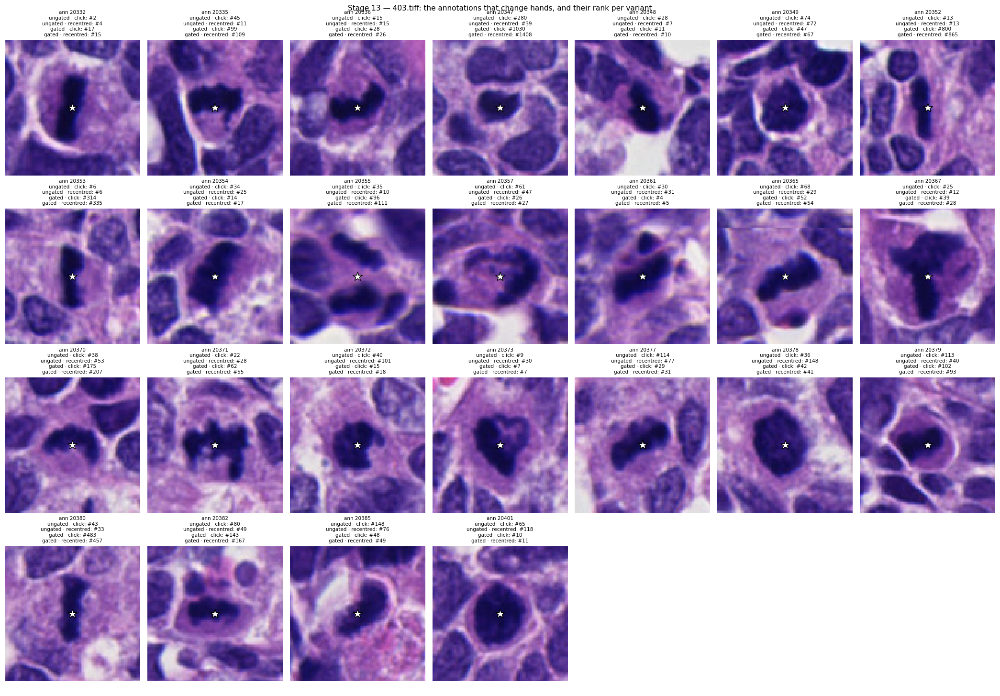

  -> figures/403_stage13_changed_anns.png


In [29]:
_TRACE_CACHE = {}


def ann_trace(roi, ann_id):
    '''Rank, score and geometry for one annotation under every variant.'''
    if (roi, ann_id) in _TRACE_CACHE:
        return _TRACE_CACHE[(roi, ann_id)]
    rows = []
    for v in VARIANTS:
        r = RUNS[(roi, v.name)]
        if ann_id == r['seed_ann_id']:
            rows.append(dict(variant=v.name, rank=np.nan, score=np.nan, z=np.nan,
                             note='THIS variant\'s own seed -- excluded from gt_eval',
                             dist_to_template_px=0.0))
            continue
        g = r['gt_eval'][r['gt_eval']['ann_id'] == ann_id]
        gx, gy = (float(g['cx'].iloc[0]), float(g['cy'].iloc[0])) if len(g) else (np.nan, np.nan)
        d = r['pools'][SELF_HIT_PINNED]['det']
        hit = d[d['matched_ann_id'] == ann_id]
        rows.append(dict(
            variant=v.name,
            rank=int(hit['rank'].iloc[0]) if len(hit) else np.nan,
            score=round(float(hit['score'].iloc[0]), 1) if len(hit) else np.nan,
            z=round(float((hit['score'].iloc[0] - r['med']) / r['mad']), 3) if len(hit) else np.nan,
            note='' if len(hit) else 'never matched anywhere in the full list',
            dist_to_template_px=round(float(np.hypot(gx - r['tpl_xy'][0], gy - r['tpl_xy'][1])), 1)))
    _TRACE_CACHE[(roi, ann_id)] = pd.DataFrame(rows)
    return _TRACE_CACHE[(roi, ann_id)]


for roi in ROIS:
    anns = CHANGED[roi]
    if not anns:
        print(f'{roi}: no annotation changes hands.')
        continue
    for ann in anns:
        print(f'\n=== {roi}  annotation {ann}')
        display(ann_trace(roi, ann))

    ncol = min(len(anns), 7)                    # wrap: 403 changes hands on 25 annotations
    nrow = int(np.ceil(len(anns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(3.0 * ncol, 3.7 * nrow), squeeze=False)
    flat = axes.ravel()
    for ax in flat[len(anns):]:
        ax.axis('off')
    for ax, ann in zip(flat, anns):
        g = ROI_INFO[roi]['gt']
        row = g[g['ann_id'] == ann].iloc[0]
        ax.imshow(crop_rgb(roi, row['cx'], row['cy'], 91), interpolation='nearest')
        ax.plot(45, 45, marker='*', markersize=15, color='white', markeredgecolor='black')
        ranks = {v.name: ann_trace(roi, ann).set_index('variant').loc[v.name, 'rank']
                 for v in VARIANTS}
        cap = '\n'.join(f"{v.label}: "
                        f"{'seed' if ann == RUNS[(roi, v.name)]['seed_ann_id'] else (f'#{int(ranks[v.name])}' if pd.notna(ranks[v.name]) else '—')}"
                        for v in VARIANTS)
        ax.set_title(f'ann {ann}\n{cap}', fontsize=7.5)
        ax.axis('off')
    fig.suptitle(f'Stage 13 — {roi}: the annotations that change hands, and their rank per variant',
                 fontsize=11)
    fig.tight_layout()
    savefig(fig, f'{roi.replace(".tiff", "")}_stage13_changed_anns.png')

## Stage 14 — the summary, and what it does not support

,roi,variant,seed_ann_id,tp@10,tp@20,tp@30,tp@50,base_size,offset_px,n_retries,n_detections,prec@10,prec@20,prec@30,prec@50
0,245.tiff,gated_click,6274,0,2,2,3,47,0.000,0,19191,0.0,0.10,0.067,0.06
1,245.tiff,gated_recentred,6274,1,1,1,1,47,4.301,0,18790,0.1,0.05,0.033,0.02
2,245.tiff,ungated_click,6274,0,2,2,3,47,0.000,0,19191,0.0,0.10,0.067,0.06
3,245.tiff,ungated_recentred,6274,1,1,1,1,47,4.301,0,18790,0.1,0.05,0.033,0.02
4,403.tiff,gated_click,20356,4,8,11,15,51,0.000,1,16689,0.4,0.40,0.367,0.30
5,403.tiff,gated_recentred,20356,4,8,11,14,51,1.581,1,16406,0.4,0.40,0.367,0.28
6,403.tiff,ungated_click,20334,4,6,10,17,33,0.000,0,17236,0.4,0.30,0.333,0.34
7,403.tiff,ungated_recentred,20334,5,9,13,19,33,16.008,0,17153,0.5,0.45,0.433,0.38


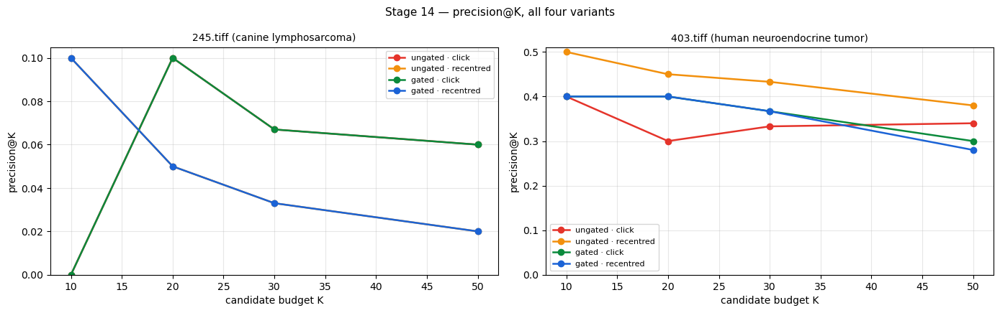

  -> figures/stage14_precision_at_k.png

notebook wall clock: 244s
figures: 27 in figures/   artifacts: 16 in artifacts/


In [30]:
SUMMARY = (TRACE[['roi', 'variant', 'seed_ann_id'] + [f'tp@{k}' for k in BUDGETS]]
           .merge(SEEDS[['roi', 'variant', 'base_size', 'offset_px', 'n_retries', 'n_detections']],
                  on=['roi', 'variant'])
           .sort_values(['roi', 'variant']))
for k in BUDGETS:
    SUMMARY[f'prec@{k}'] = (SUMMARY[f'tp@{k}'] / k).round(3)
SUMMARY.to_csv(f'{ARTDIR}/summary.csv', index=False)
display(SUMMARY)

fig, axes = plt.subplots(1, len(ROIS), figsize=(7.0 * len(ROIS), 4.4), squeeze=False)
for ax, roi in zip(axes[0], ROIS):
    for v in VARIANTS:
        s = SUMMARY[(SUMMARY['roi'] == roi) & (SUMMARY['variant'] == v.name)]
        ax.plot(BUDGETS, [float(s[f'prec@{k}'].iloc[0]) for k in BUDGETS], marker='o',
                color=VAR_COLOR[v.name], label=v.label, lw=1.8)
    ax.set_xlabel('candidate budget K'); ax.set_ylabel('precision@K')
    ax.set_title(f"{roi} ({ROI_INFO[roi]['domain']})", fontsize=10)
    ax.grid(alpha=0.3); ax.legend(fontsize=8); ax.set_ylim(bottom=0)
fig.suptitle('Stage 14 — precision@K, all four variants', fontsize=11)
fig.tight_layout()
savefig(fig, 'stage14_precision_at_k.png')

print(f'\nnotebook wall clock: {time.time() - NB_T0:.0f}s')
print(f"figures: {len(os.listdir(FIGDIR))} in {FIGDIR}/   artifacts: {len(os.listdir(ARTDIR))} in {ARTDIR}/")

### What this notebook supports

- **The containment gate and the template centre are separate decisions**, and on `245.tiff` only
  the second one is doing anything. Gate 0 proves the two selection rules return the same box there,
  and Gate 0b shows the 2×2 collapsing to two runs as a consequence. Any account of 245 that
  attributes the difference to the gate is wrong.
- **On `403.tiff` the gate is the whole story**: it rejects a click sitting on a background pixel
  (Gate 1b) and redraws onto a real, click-containing component. That is the gate working as
  designed, and it is why `DECISIONS.md` D8's amendment excluded 403 from its per-ROI centring
  figures.
- **The `SELF_HIT_RADIUS` mismatch between the committed 8-aug notebooks is not a confound in
  D8's amendment evidence** (Gate 3). Every arm, at the radius it was actually run with, leaves a
  clean annulus (3a), and wherever both radii clear that annulus they give identical pools (3b). The
  one run where they differ — `403.tiff`, ungated rule, 5.0 px — is the seed's own self-correlation
  sitting 6.08 px out, which is the documented reason the 8-aug notebooks widened to 10.0 in the
  first place. It was still worth pinning: the recentred family's `5.0` is correct here by luck, not
  by construction, and a seed draw that displaced its self-peak the same way would put a rank-1 false
  positive into every budget.

### What it does not support

**Nothing cross-pair on 403.** The gate changed the draw there, so the ungated and gated arms
differ in seed annotation, template size, centre *and* which annotation is excluded from `gt_eval`.
`ungated_recentred` scoring highest on 403 is an observation about four simultaneous changes, not a
result about recentring — see the Stage 11 caveat. Only the within-pair deltas isolate centring.

This is **one seed on two ROIs**. It is mechanism, not outcome. `DECISIONS.md` D5 sets the bar for
this class of decision — a 5-seed sweep with the paired delta clustered at the ROI — and nothing
here meets it. In particular, nothing in this notebook is evidence for or against reversing D8's
amendment; it explains *how* the variants differ on two ROIs, not *which one is better*.

The natural next step is the sweep D8's amendment itself asks for: 5 seeds × 14 ROIs, paired delta
clustered at the ROI, with `SELF_HIT_RADIUS` held equal across arms — which Gate 3 now shows would
not have changed the existing answer, but should be held fixed anyway so the next comparison has one
free variable by construction rather than by luck.